In [2]:
# Connecting Google Drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
import xgboost as xgb
from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import warnings
warnings.filterwarnings("ignore")

import random
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)                      # NumPy random seed
tf.random.set_seed(SEED)                  # TensorFlow random seed
random.seed(SEED)                         # Python random seed

# TensorFlow session configuration for reproducibility, without setting the session explicitly
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
session_conf.gpu_options.allow_growth = True

# Exploratery Data Analysis

## 1. BLE based dataset

In [ ]:
import os
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
from scipy.stats import skew, kurtosis  # Import skew and kurtosis

from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)


In [ ]:

# Path to the directory containing CSV files
data_directory = "/content/drive/MyDrive/DATASETS/1. RSSI using BLE/Indoor Environment Dataset Based on RSSI Collected with Bluetooth Devices"

# Initialize an empty list to store DataFrames
dataframes = []

# Iterate through all files in the directory
for file in os.listdir(data_directory):
    if file.endswith(".csv"):  # Only process CSV files
        file_path = os.path.join(data_directory, file)
        df = pd.read_csv(file_path)
        dataframes.append(df)

# Combine all DataFrames into one
data = pd.concat(dataframes, ignore_index=True)

# # Identify WAP columns and other columns
# wap_columns = sorted([col for col in data.columns if col.startswith('WAP')],
#                      key=lambda x: int(x.replace('WAP', '')))

# other_columns = [col for col in data.columns if not col.startswith('WAP')]

# # Reorder the DataFrame
# data = data[wap_columns + other_columns]

# Display the first few rows of the reordered DataFrame
data.head()

,WAP1,WAP2,WAP3,WAP4,WAP5,WAP6,WAP7,WAP8,WAP9,WAP10,WAP11,WAP12,WAP13,WAP14,WAP15,LABEL,X,Y,DEVICE,ROOM_ID
0,-87,-105,-105,-105,-105,-105,-105,-105,-105,-105,-75,-95,-91,-105,-105,16_1_5,1.5,14.8,1210,16
1,-83,-105,-105,-105,-105,-105,-105,-105,-105,-105,-70,-93,-93,-105,-105,16_1_5,1.5,14.8,1210,16
2,-92,-105,-105,-105,-105,-105,-105,-105,-105,-105,-65,-105,-93,-105,-105,16_1_5,1.5,14.8,1210,16
3,-86,-105,-105,-105,-105,-105,-105,-105,-105,-105,-73,-96,-85,-105,-105,16_1_5,1.5,14.8,1210,16
4,-87,-105,-105,-105,-105,-105,-105,-105,-105,-105,-72,-93,-91,-105,-105,16_1_5,1.5,14.8,1210,16


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["X"].min(), data["X"].max()
y_min, y_max = data["Y"].min(), data["Y"].max()

print(f"X_min: {x_min}, X_max: {x_max}")
print(f"Y_min: {y_min}, Y_max: {y_max}")


X_min: 1.4, X_max: 43.3
Y_min: 1.5, Y_max: 22.5


In [ ]:
# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'WAP' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -105 dBm
Maximum RSSI: -57 dBm
RSSI Range: 48 dBm


In [ ]:

# Check unique values for categorical columns
print(data['ROOM_ID'].unique())
print(data['DEVICE'].unique())


[16 39 40 41 43 45 46 47 51 53 57 61 62 63]
[1210 '121B' '1F61' '121D' '10B2' 2055 '104D' '20B5' 1212 1211 '10CE']


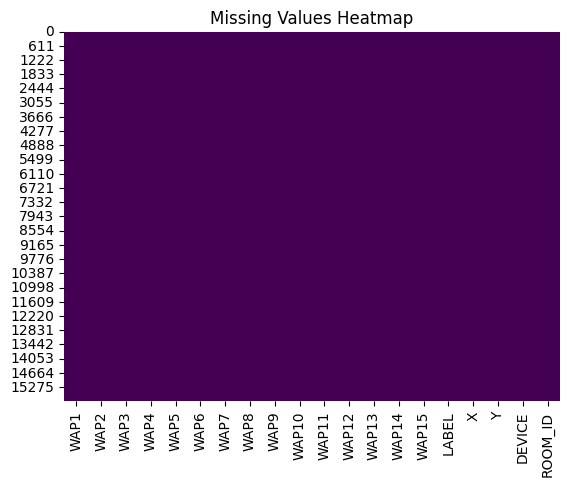

In [ ]:
# Handling missing values

# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill NaN with -105 (common practice for undetected RSSI signals)
data.fillna(-105, inplace=True)

In [ ]:
import numpy as np
rssi_columns = data.columns[data.columns.str.startswith('WAP')] # Get all columns that starts with WAP
wap_columns = rssi_columns  # If 'wap_columns' is intended to be the same as 'rssi_columns'

# Now your code should work correctly:
contains_minus_105 = (data[wap_columns] == -105).any().any()
# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")


Missing (NaN) values per column:
 Series([], dtype: int64)
⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.


In [ ]:
# Identify RSSI columns
rssi_columns = [col for col in data.columns if 'WAP' in col]

# Summary statistics
print(data[rssi_columns].describe())

               WAP1          WAP2          WAP3          WAP4          WAP5  \
count  15881.000000  15881.000000  15881.000000  15881.000000  15881.000000   
mean    -100.794094   -100.696682    -99.881871    -99.676910    -98.635602   
std        8.998372      7.982955      8.822445      8.802891      8.895992   
min     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
25%     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
50%     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
75%     -105.000000    -98.000000    -95.000000    -94.000000    -92.000000   
max      -61.000000    -64.000000    -60.000000    -59.000000    -59.000000   

               WAP6          WAP7          WAP8          WAP9         WAP10  \
count  15881.000000  15881.000000  15881.000000  15881.000000  15881.000000   
mean     -99.159814   -100.369309   -100.186764    -99.914048    -99.723821   
std        9.404506      8.670236      8.815161    

In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15881 entries, 0 to 15880
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   WAP1     15881 non-null  int64  
 1   WAP2     15881 non-null  int64  
 2   WAP3     15881 non-null  int64  
 3   WAP4     15881 non-null  int64  
 4   WAP5     15881 non-null  int64  
 5   WAP6     15881 non-null  int64  
 6   WAP7     15881 non-null  int64  
 7   WAP8     15881 non-null  int64  
 8   WAP9     15881 non-null  int64  
 9   WAP10    15881 non-null  int64  
 10  WAP11    15881 non-null  int64  
 11  WAP12    15881 non-null  int64  
 12  WAP13    15881 non-null  int64  
 13  WAP14    15881 non-null  int64  
 14  WAP15    15881 non-null  int64  
 15  LABEL    15881 non-null  object 
 16  X        15881 non-null  float64
 17  Y        15881 non-null  float64
 18  DEVICE   15881 non-null  object 
 19  ROOM_ID  15881 non-null  int64  
dtypes: float64(2), int64(16), object(2)
memory usage: 

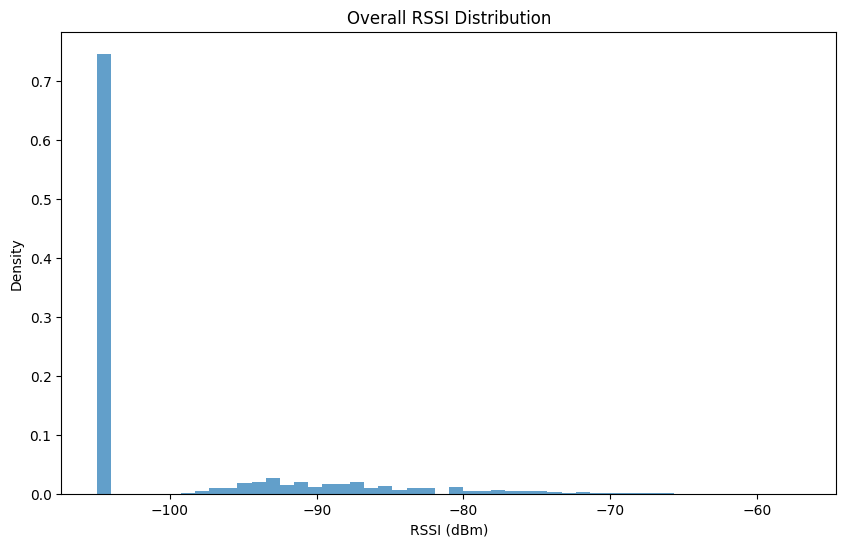

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
plt.title("Overall RSSI Distribution")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

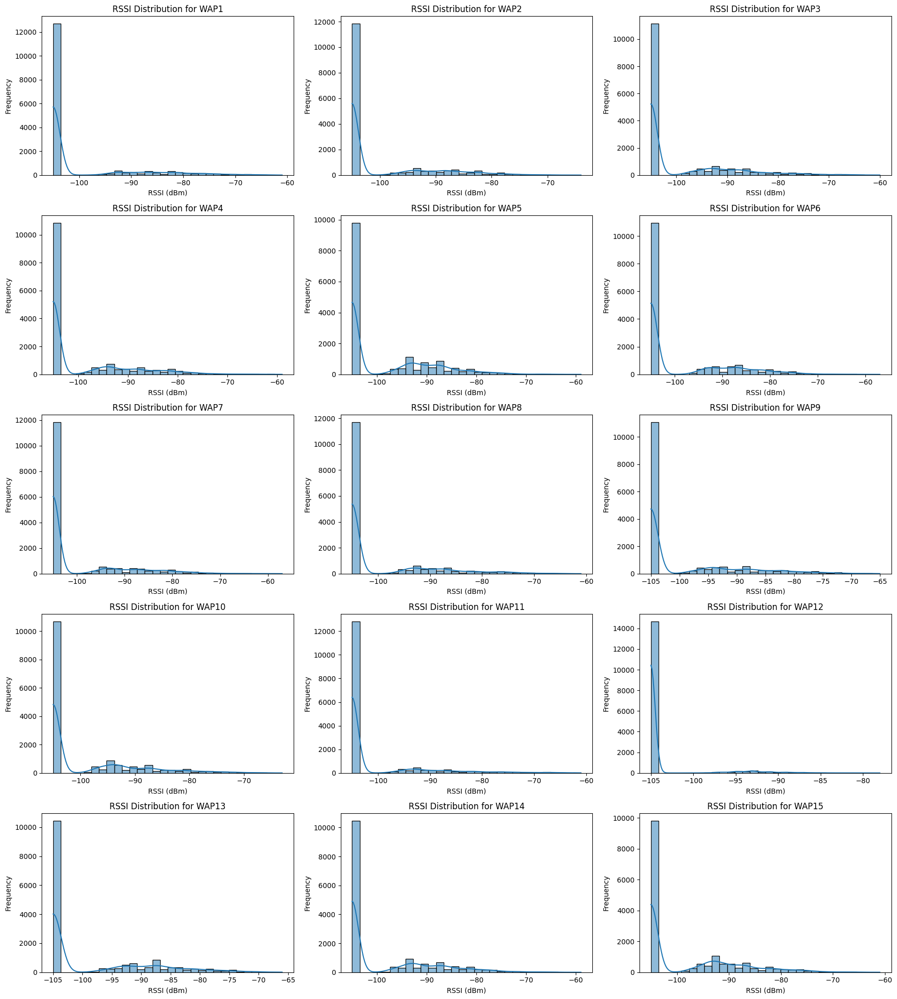

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(18, 20))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:15]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distributions_per_wap.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-43-2d56091fbe1f>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


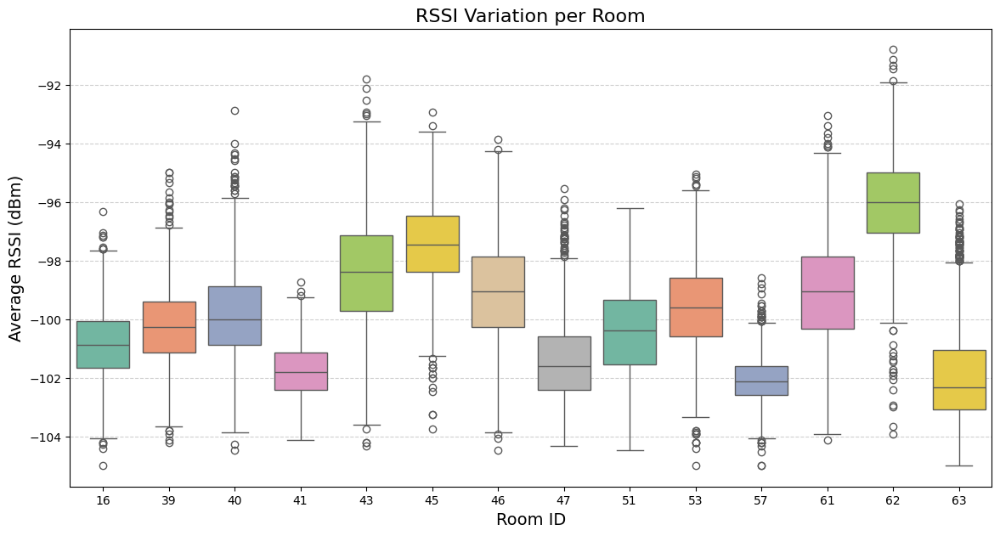

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='ROOM_ID',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Room", fontsize=16)
plt.xlabel("Room ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig('rssi_variation_room.png', dpi=300, bbox_inches='tight')
plt.show()

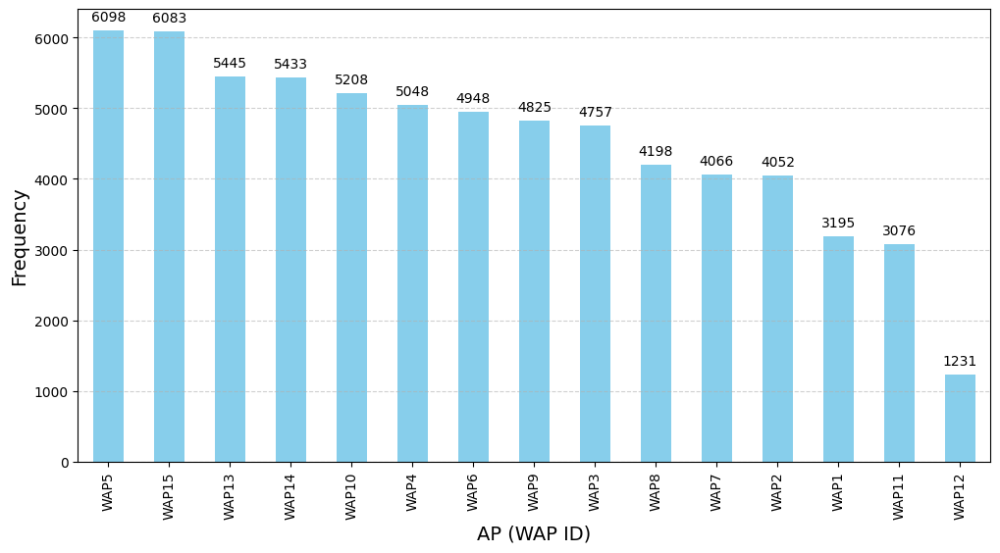

In [ ]:
# AP Utilization & Coverage Analysis
# AP detection frequency
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
ax = ap_usage.plot(kind='bar', color='skyblue')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(
        str(int(p.get_height())),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10, xytext=(0, 5),
        textcoords='offset points'
    )

# plt.title("AP Detection Frequency", fontsize=16)
plt.xlabel("AP (WAP ID)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.savefig('ap_detection_frequency.png', dpi=300, bbox_inches='tight')
plt.show()

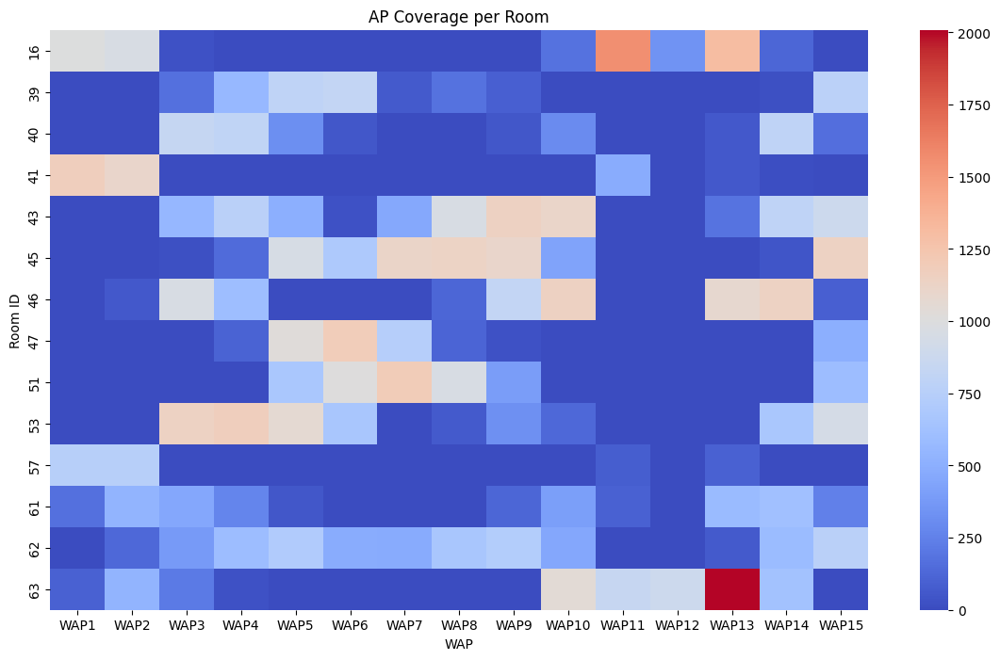

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('ROOM_ID')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage per Room")
plt.xlabel("WAP")
plt.ylabel("Room ID")
plt.savefig('ap_coverage_per_room.png', dpi=300, bbox_inches='tight')
plt.show()

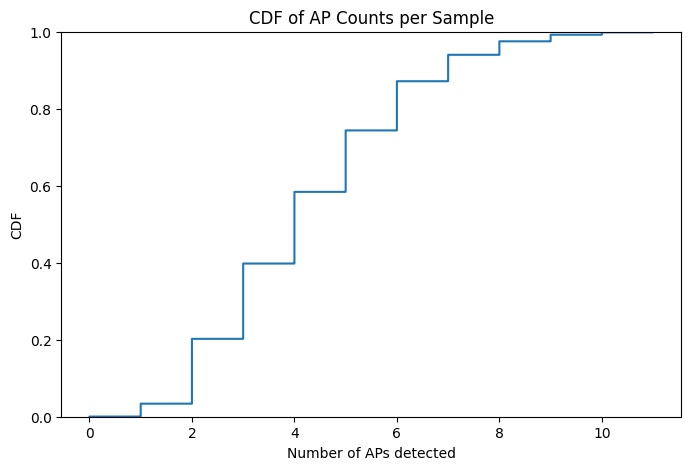

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts.png', dpi=300, bbox_inches='tight')
plt.show()

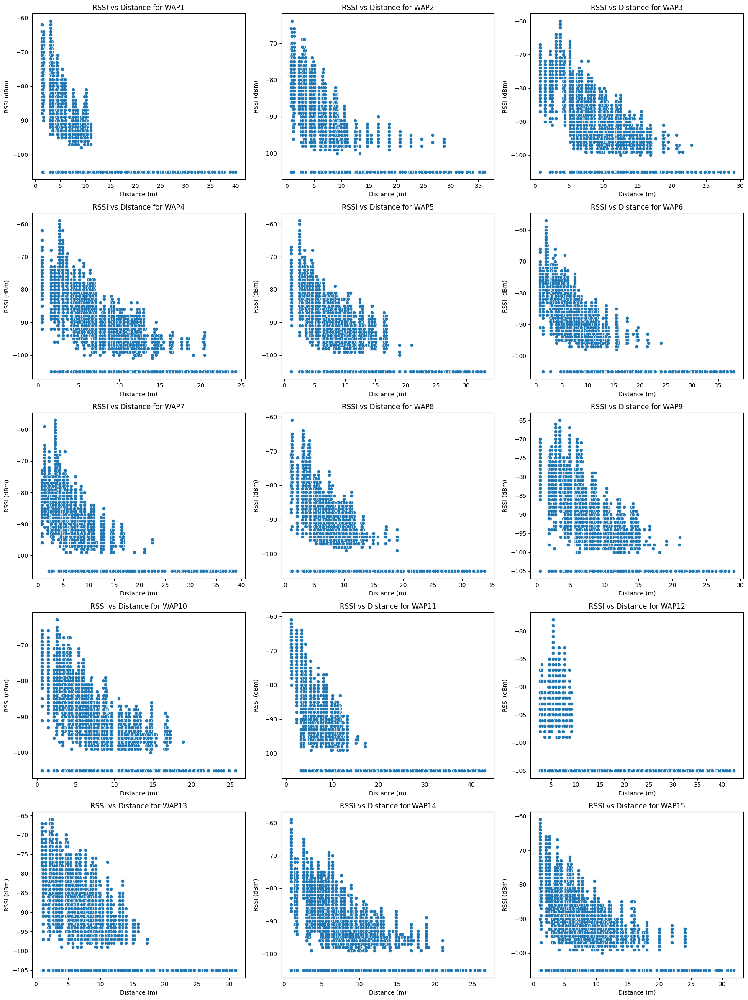

In [ ]:
# Spatial Consistency (RSSI vs distance)
waps_positions = {'WAP1' : [4.3 , 5.0 ], 'WAP2' : [8.0 , 6.0 ],'WAP3' : [16.5, 3.0 ],
                  'WAP4' : [23.0, 3.5 ], 'WAP5' : [33.0, 5.0 ],'WAP6' : [38.0, 4.3 ],
                  'WAP7' : [39.0, 11.2], 'WAP8' : [33.5, 12.0],'WAP9' : [28.5, 12.0],
                  'WAP10': [20.0, 12.3], 'WAP11': [1.5 , 11.4],'WAP12': [4.0 , 17.5],
                  'WAP13': [13.5, 10.0], 'WAP14': [17.8, 9.0 ],'WAP15': [32.3, 9.0 ]}

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(18, 24))
axes = axes.flatten()

for i, (wap, pos) in enumerate(waps_positions.items()):
    distances = np.sqrt((data["X"] - pos[0])**2 + (data["Y"] - pos[1])**2)
    sns.scatterplot(x=distances, y=data[wap], ax=axes[i])
    axes[i].set_title(f"RSSI vs Distance for {wap}")
    axes[i].set_xlabel("Distance (m)")
    axes[i].set_ylabel("RSSI (dBm)")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distance.png', dpi=300, bbox_inches='tight')
plt.show()


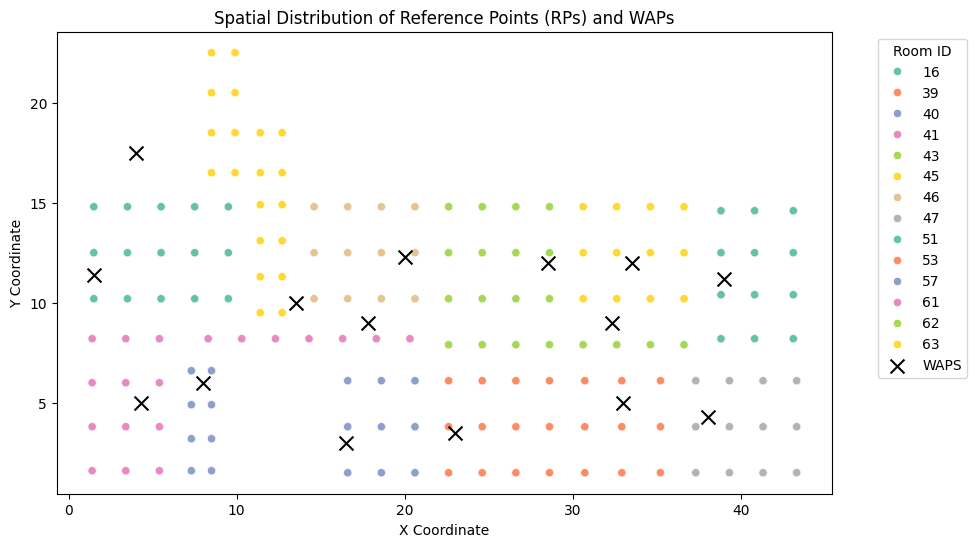

In [ ]:
plt.figure(figsize=(10, 6))
waps_positions = {'WAP1' : [4.3 , 5.0 ], 'WAP2' : [8.0 , 6.0 ],'WAP3' : [16.5, 3.0 ],
                  'WAP4' : [23.0, 3.5 ], 'WAP5' : [33.0, 5.0 ],'WAP6' : [38.0, 4.3 ],
                  'WAP7' : [39.0, 11.2], 'WAP8' : [33.5, 12.0],'WAP9' : [28.5, 12.0],
                  'WAP10': [20.0, 12.3], 'WAP11': [1.5 , 11.4],'WAP12': [4.0 , 17.5],
                  'WAP13': [13.5, 10.0], 'WAP14': [17.8, 9.0 ],'WAP15': [32.3, 9.0 ]}

sns.scatterplot(x='X', y='Y', hue='ROOM_ID', data=data, palette="Set2")
plt.title("Spatial Distribution of Reference Points (RPs) and WAPs")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
for wap, position in waps_positions.items():
    plt.scatter(position[0], position[1], marker='x', s=100, color='black')
plt.legend(title="Room ID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
# plt.title("WAP Locations")
# Add a single legend entry for all WAPs.
plt.scatter([], [], marker='x', s=100, color='black', label='WAPS')
plt.legend(title="Room ID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('spatial_distribution.png', dpi=300, bbox_inches='tight')

plt.show()


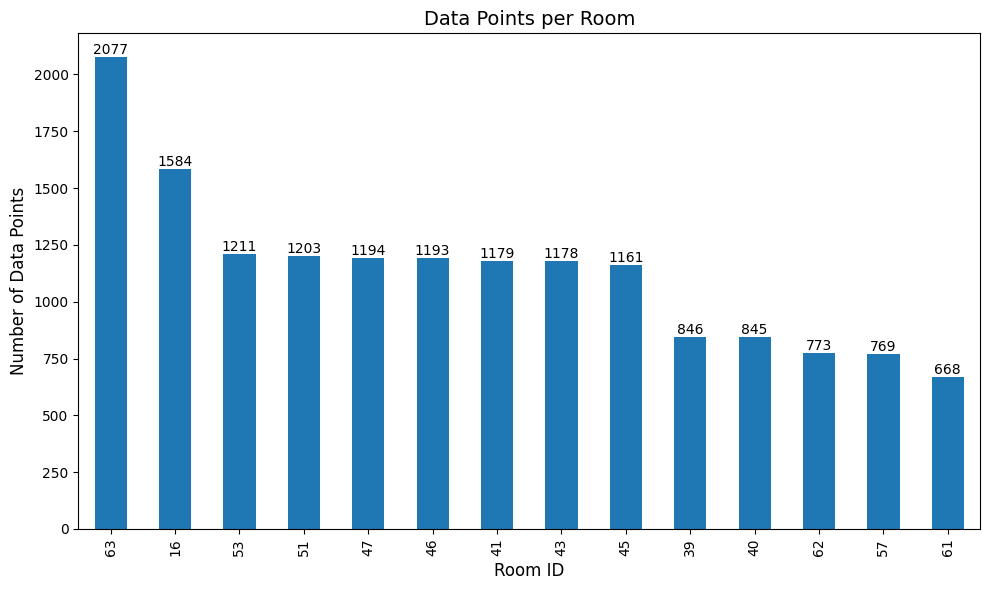

In [ ]:
import matplotlib.pyplot as plt

# Count data points per room
room_counts = data['ROOM_ID'].value_counts()
ax = room_counts.plot(kind='bar', figsize=(10, 6))
plt.title("Data Points per Room", fontsize=14)
plt.xlabel("Room ID", fontsize=12)
plt.ylabel("Number of Data Points", fontsize=12)

# Add value annotations on each bar for rooms
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig('room_data_distribution.png', dpi=300, bbox_inches='tight')
plt.show()



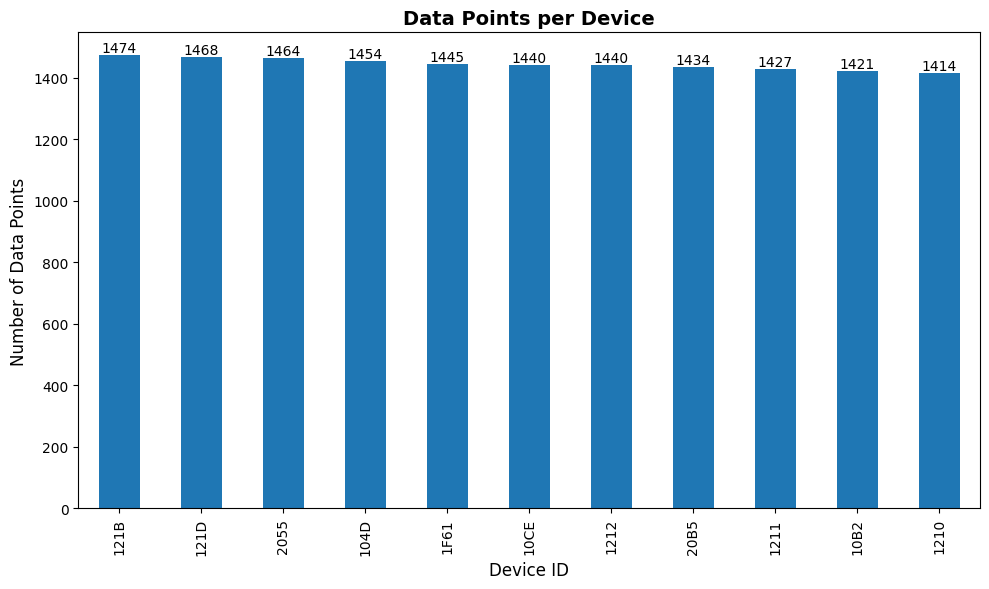

In [ ]:
# Count data points per device
device_counts = data['DEVICE'].value_counts()
ax = device_counts.plot(kind='bar', figsize=(10, 6))
plt.title("Data Points per Device", fontsize=14, fontweight='bold')
plt.xlabel("Device ID", fontsize=12)
plt.ylabel("Number of Data Points", fontsize=12)

# Add value annotations on each bar for devices
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig('5.png', dpi=300, bbox_inches='tight')
plt.show()


RSSI Data Summary:
               WAP11          WAP5          WAP3          WAP1          WAP9  \
count  15881.000000  15881.000000  15881.000000  15881.000000  15881.000000   
mean    -101.440841    -98.635602    -99.881871   -100.794094    -99.914048   
std        8.104500      8.895992      8.822445      8.998372      8.618019   
min     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
25%     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
50%     -105.000000   -105.000000   -105.000000   -105.000000   -105.000000   
75%     -105.000000    -92.000000    -95.000000   -105.000000    -95.000000   
max      -61.000000    -59.000000    -60.000000    -61.000000    -65.000000   

              WAP12          WAP8         WAP10          WAP6          WAP7  \
count  15881.000000  15881.000000  15881.000000  15881.000000  15881.000000   
mean    -104.023172   -100.186764    -99.723821    -99.159814   -100.369309   
std        3.491745      8.815

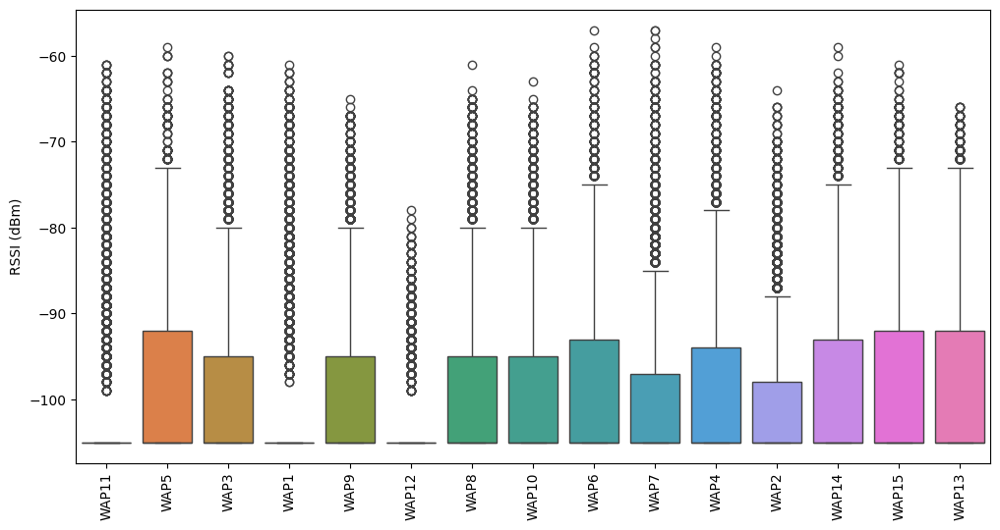

In [ ]:
# Summary of Signal Strength (RSSI) Data

# Select only RSSI columns (AP/WAP columns)
rssi_columns = [col for col in data.columns if "AP" in col or "WAP" in col]

# Describe RSSI statistics
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())

# Plot RSSI Distribution
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
# plt.title("Distribution of RSSI Values Across APs")
plt.ylabel("RSSI (dBm)")
plt.savefig('rssi_boxplot.png', dpi=300, bbox_inches='tight')

plt.show()


Devices used for collection: [1210 '121B' '1F61' '121D' '10B2' 2055 '104D' '20B5' 1212 1211 '10CE']


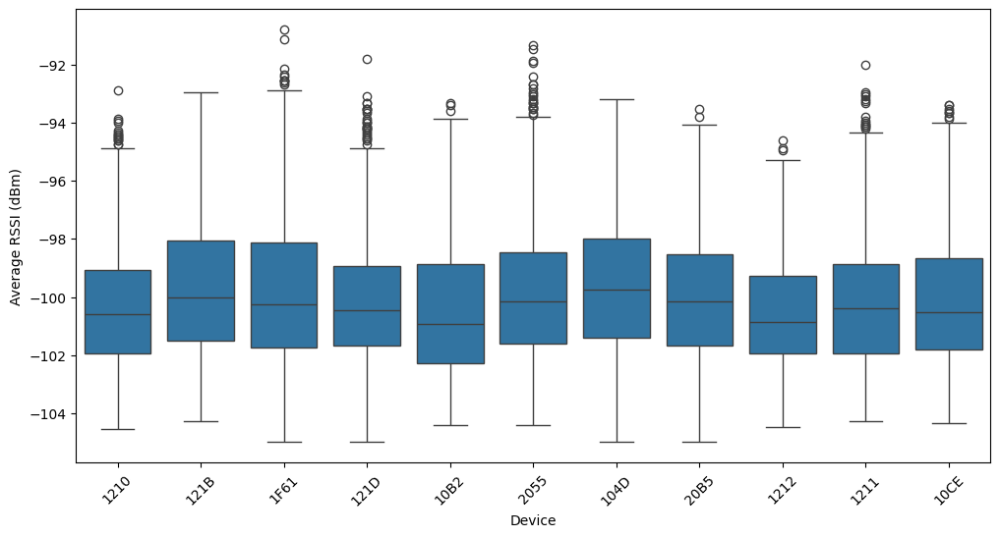

In [ ]:
#  Device Impact on RSSI Measurements

# Check unique devices
print("Devices used for collection:", data["DEVICE"].unique())

# Boxplot of RSSI values across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["DEVICE"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
# plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device")
plt.ylabel("Average RSSI (dBm)")
plt.savefig('rssi_device_boxplot.png', dpi=300, bbox_inches='tight')

plt.show()


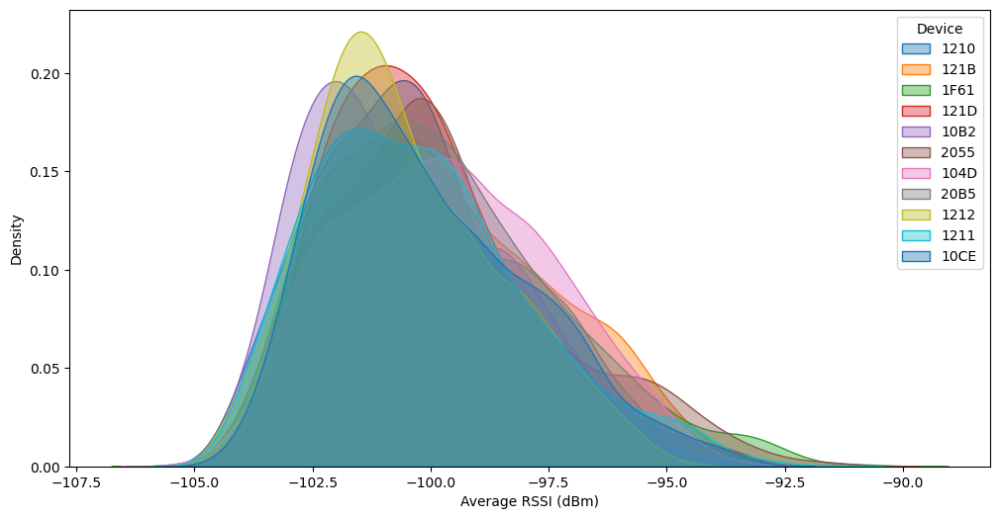

In [ ]:
# KDE (Kernel Density Estimation) Plot

plt.figure(figsize=(12, 6))
for device in data["DEVICE"].unique():
    sns.kdeplot(data[data["DEVICE"] == device][rssi_columns].mean(axis=1), label=device, fill=True, alpha=0.4)

# plt.title("RSSI Distribution Across Different Devices (KDE Plot)")
plt.xlabel("Average RSSI (dBm)")
plt.ylabel("Density")
plt.legend(title="Device")
plt.savefig('rssi_device_kde.png', dpi=300, bbox_inches='tight')

plt.show()


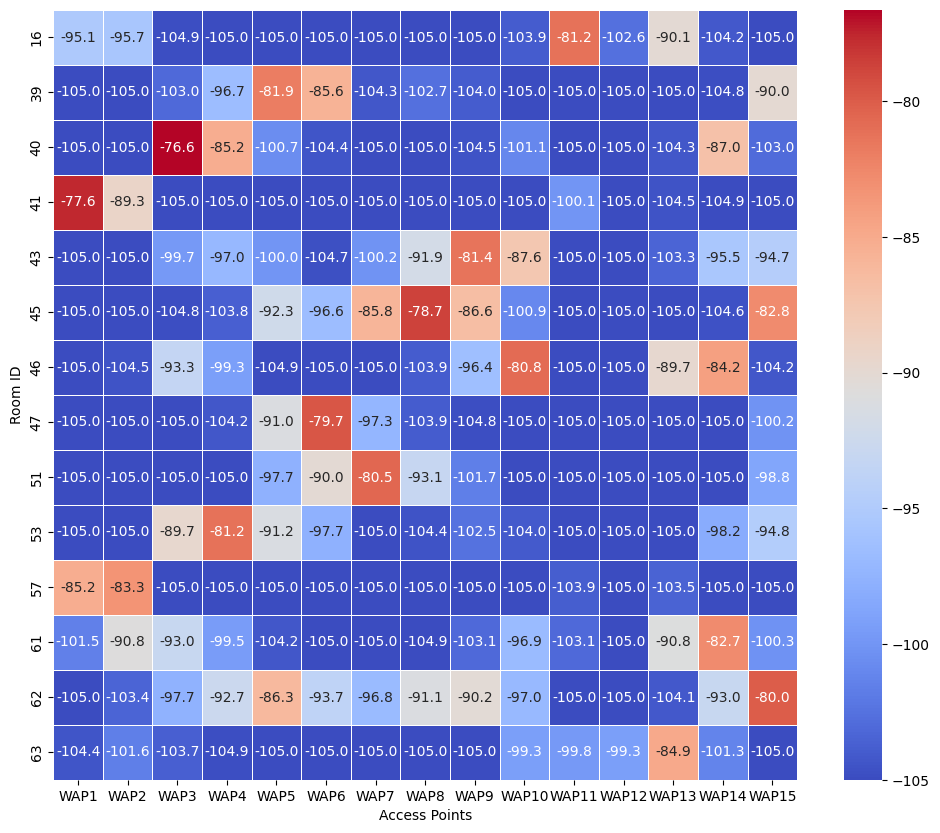

In [ ]:
# Room-Level Signal Strength Analysis

# Group by ROOM_ID and compute mean RSSI per room
room_rssi = data.groupby("ROOM_ID")[rssi_columns].mean()

# Heatmap of mean RSSI per room with values
plt.figure(figsize=(12, 10))
sns.heatmap(room_rssi, cmap="coolwarm", linewidths=0.5, annot=True, fmt=".1f")  # fmt=".1f" limits to 1 decimal place
# plt.title("Average RSSI per Access Point in Each Room")
plt.xlabel("Access Points")
plt.ylabel("Room ID")
plt.savefig('avg_rssi_per_room.png', dpi=300, bbox_inches='tight')

plt.show()


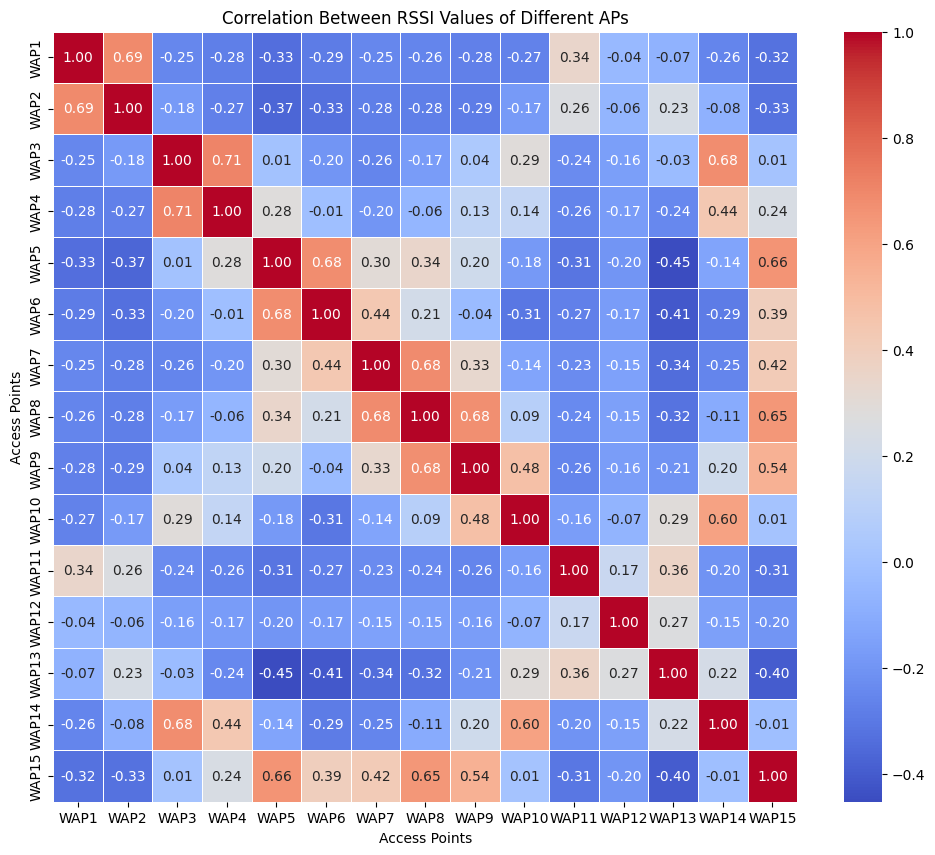

In [ ]:
# Compute correlation matrix
corr_matrix = data[rssi_columns].corr()

# Plot heatmap of correlation between APs with values
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)  # fmt=".2f" limits to 2 decimal places
plt.title("Correlation Between RSSI Values of Different APs")
plt.xlabel("Access Points")
plt.ylabel("Access Points")
plt.savefig('rssi_correlation.png', dpi=300, bbox_inches='tight')

plt.show()


## 2. SODIndoorLoc Dataset

In [ ]:
import os
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
from scipy.stats import skew, kurtosis  # Import skew and kurtosis

from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)


### CETC331 BYILDING

In [ ]:
# Path to the directory containing CSV files
data_directory = "/content/drive/MyDrive/DATASETS/2. SODloc /SODIndoorLoc-main/CETC331/Training_CETC331.csv"
data = pd.read_csv(data_directory)
data.head()

,MAC1,MAC2,MAC3,MAC4,MAC5,MAC6,MAC7,MAC8,MAC9,MAC10,...,MAC51,MAC52,ECoord,NCoord,FloorID,BuildingID,SceneID,UserID,PhoneID,SampleTimes
0,-44,-48,-71,-85,-92,100,100,100,-88,100,...,100,100,45.0,17.5,1,1,1,4,3,1
1,-37,-50,-72,-85,-93,100,-93,100,-86,100,...,100,100,45.5,17.5,1,1,1,4,3,1
2,-41,-51,-68,-84,-88,100,-93,100,-84,100,...,100,100,46.0,17.5,1,1,1,4,3,1
3,-38,-50,-67,-89,-83,-90,-92,100,-83,100,...,100,100,46.5,17.5,1,1,1,4,3,1
4,-35,-57,-63,-87,-86,-87,100,100,-81,100,...,100,100,46.9,17.5,1,1,1,4,3,1


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["ECoord"].min(), data["ECoord"].max()
y_min, y_max = data["NCoord"].min(), data["NCoord"].max()

print(f"ECoord_min: {x_min}, ECoord_max: {x_max}")
print(f"NCoord_min: {y_min}, NCoord_max: {y_max}")


ECoord_min: 45.0, ECoord_max: 61.2
NCoord_min: 14.0, NCoord_max: 70.8


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'MAC' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:
# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'MAC' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -104 dBm
Maximum RSSI: 100 dBm
RSSI Range: 204 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 955 entries, 0 to 954
Data columns (total 60 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MAC1         955 non-null    int64  
 1   MAC2         955 non-null    int64  
 2   MAC3         955 non-null    int64  
 3   MAC4         955 non-null    int64  
 4   MAC5         955 non-null    int64  
 5   MAC6         955 non-null    int64  
 6   MAC7         955 non-null    int64  
 7   MAC8         955 non-null    int64  
 8   MAC9         955 non-null    int64  
 9   MAC10        955 non-null    int64  
 10  MAC11        955 non-null    int64  
 11  MAC12        955 non-null    int64  
 12  MAC13        955 non-null    int64  
 13  MAC14        955 non-null    int64  
 14  MAC15        955 non-null    int64  
 15  MAC16        955 non-null    int64  
 16  MAC17        955 non-null    int64  
 17  MAC18        955 non-null    int64  
 18  MAC19        955 non-null    int64  
 19  MAC20   

In [ ]:
# Summary statistics
print(data.describe())

             MAC1        MAC2        MAC3        MAC4        MAC5        MAC6  \
count  955.000000  955.000000  955.000000  955.000000  955.000000  955.000000   
mean    13.113089   74.921466  -57.991623   32.068063    6.800000   47.804188   
std     89.007077   58.465305   53.356794   85.860953   85.955676   77.506153   
min    -97.000000  -98.000000  -98.000000 -104.000000 -102.000000  -91.000000   
25%    -85.000000  100.000000  -89.000000  -74.000000  -75.000000  -51.000000   
50%    100.000000  100.000000  -72.000000  100.000000  -43.000000  100.000000   
75%    100.000000  100.000000  -59.000000  100.000000  100.000000  100.000000   
max    100.000000  100.000000  100.000000  100.000000  100.000000  100.000000   

             MAC7        MAC8        MAC9       MAC10  ...       MAC51  \
count  955.000000  955.000000  955.000000  955.000000  ...  955.000000   
mean   -22.961257   43.636649    4.090052   46.814660  ...   11.449215   
std     77.926937   76.334342   82.573240   73.4

In [ ]:
# Check unique values for categorical columns
print(f'unique Buildings:{data["BuildingID"].unique()}')
print(f'unique Scenes: {data["SceneID"].unique()}')
print(f'unique Floors: {data["FloorID"].unique()}')
print(f'unique Users:{data["UserID"].unique()}')
print(f'unique Phones:{data["PhoneID"].unique()}')

unique Buildings:[1]
unique Scenes: [1 3 2]
unique Floors: [1 2 3]
unique Users:[4]
unique Phones:[3]


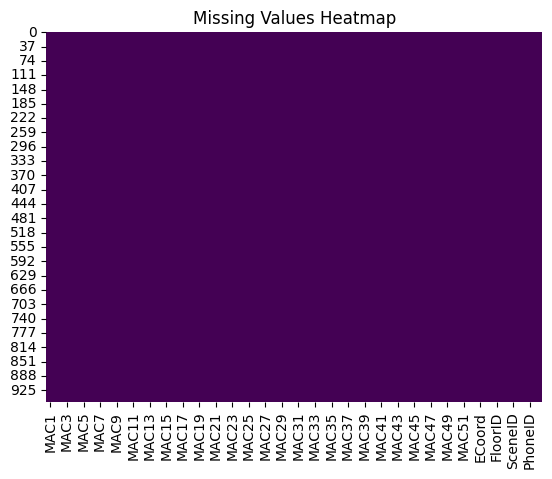

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


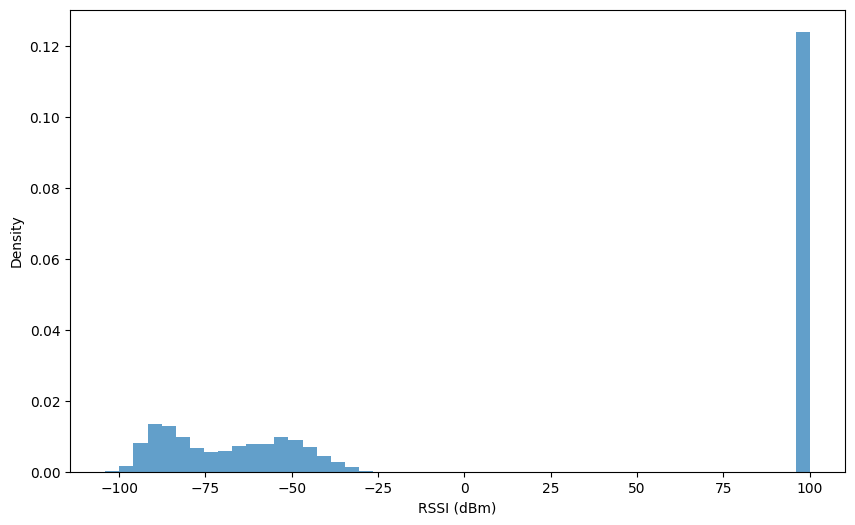

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution cetc331")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_c.png', dpi=300, bbox_inches='tight')
plt.show()

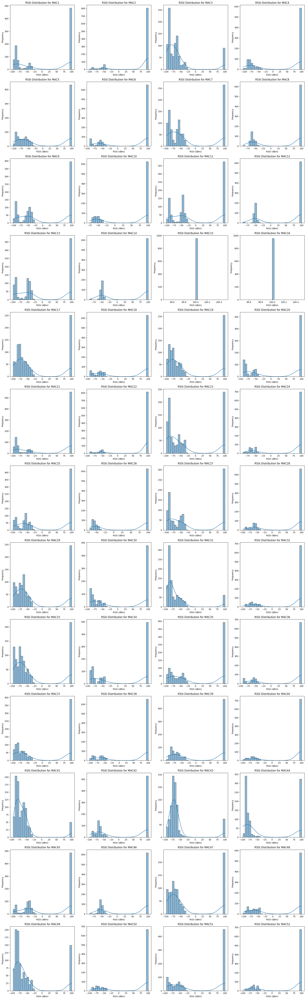

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=13, ncols=4, figsize=(20, 65))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:52]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distributions_per_wap_c.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-21-7f647d61dbb0>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


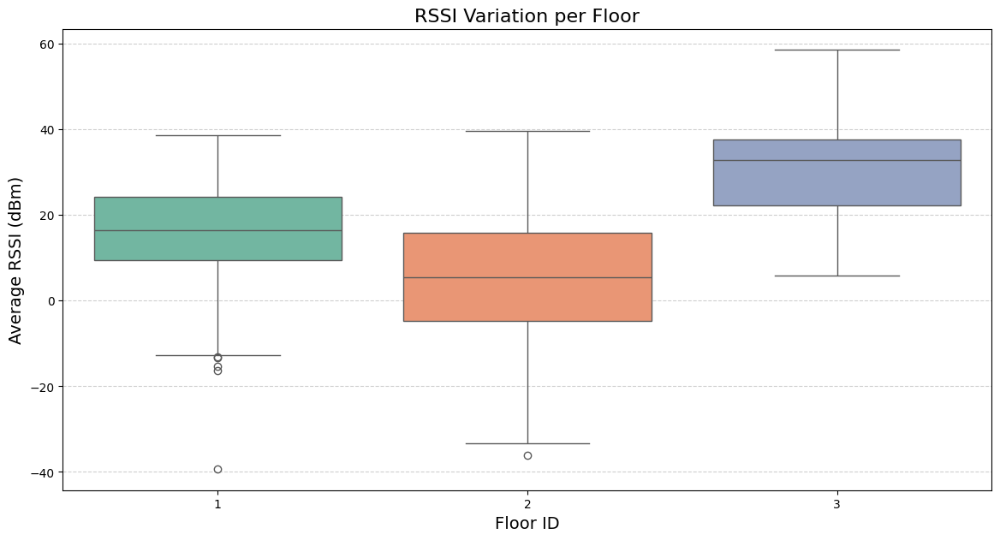

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FloorID',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig('rssi_variation_floor_c.png', dpi=300, bbox_inches='tight')
plt.show()

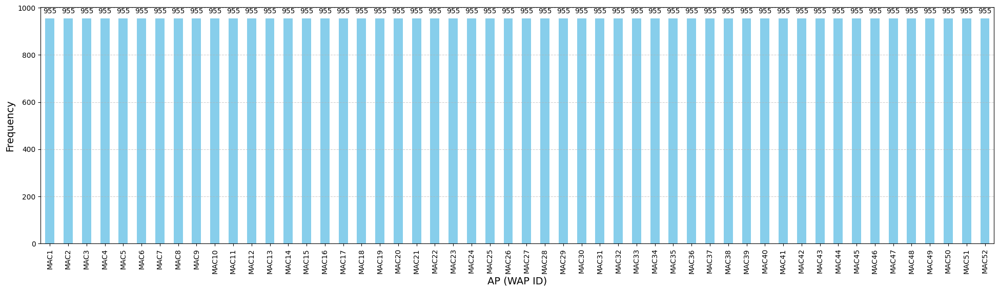

In [ ]:
# AP Utilization & Coverage Analysis
# AP detection frequency
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

plt.figure(figsize=(24, 6))
ax = ap_usage.plot(kind='bar', color='skyblue')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(
        str(int(p.get_height())),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10, xytext=(0, 5),
        textcoords='offset points'
    )

# plt.title("AP Detection Frequency", fontsize=16)
plt.xlabel("AP (WAP ID)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.savefig('ap_detection_frequency_c.png', dpi=300, bbox_inches='tight')
plt.show()

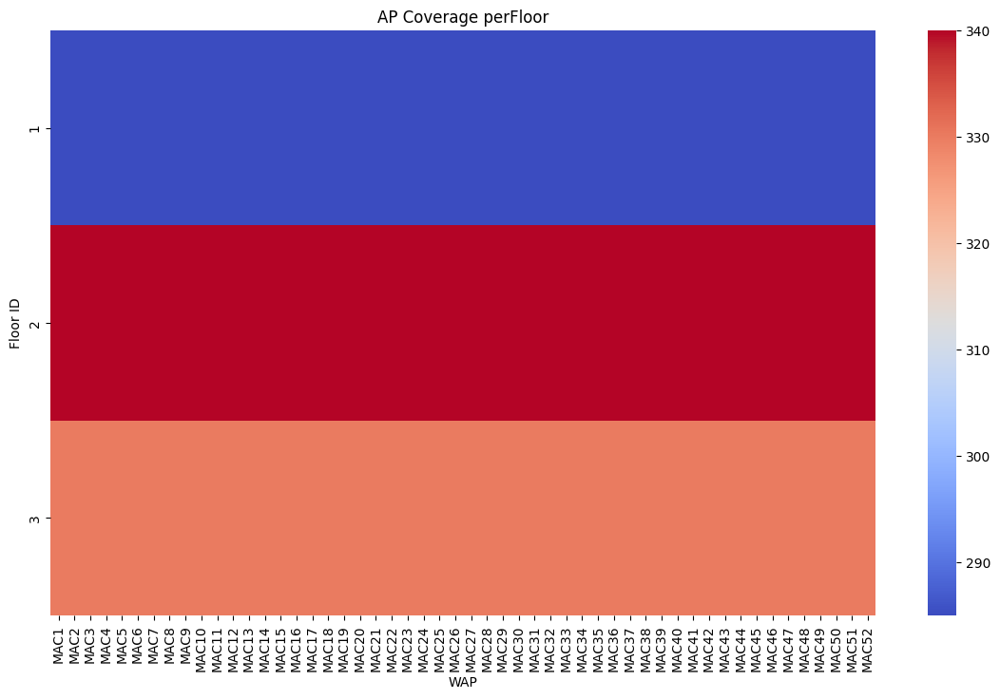

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FloorID')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
plt.savefig('ap_coverage_per_floor_c.png', dpi=300, bbox_inches='tight')
plt.show()

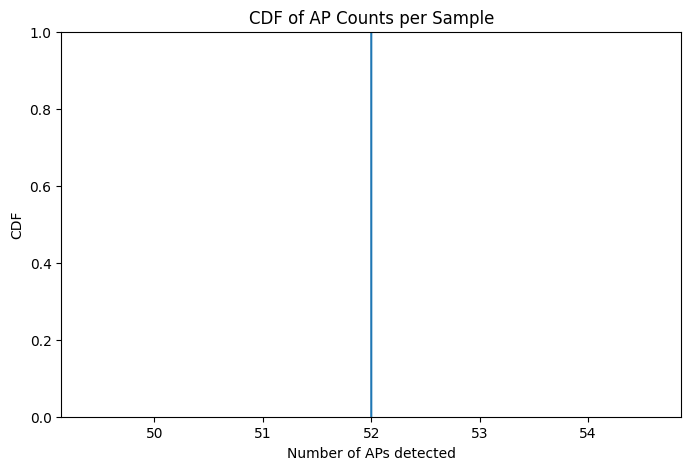

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_c.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
      MAC1   MAC2  MAC3   MAC4   MAC5   MAC6   MAC7   MAC8  MAC9  MAC10  ...  \
0     NaN    NaN   NaN    NaN    NaN  100.0  100.0  100.0   NaN  100.0  ...   
1     NaN    NaN   NaN    NaN    NaN  100.0    NaN  100.0   NaN  100.0  ...   
2     NaN    NaN   NaN    NaN    NaN  100.0    NaN  100.0   NaN  100.0  ...   
3     NaN    NaN   NaN    NaN    NaN    NaN    NaN  100.0   NaN  100.0  ...   
4     NaN    NaN   NaN    NaN    NaN    NaN  100.0  100.0   NaN  100.0  ...   
..    ...    ...   ...    ...    ...    ...    ...    ...   ...    ...  ...   
950   NaN  100.0   NaN  100.0  100.0  100.0    NaN    NaN   NaN    NaN  ...   
951   NaN  100.0   NaN  100.0  100.0  100.0    NaN    NaN   NaN    NaN  ...   
952   NaN  100.0   NaN  100.0  100.0  100.0    NaN    NaN   NaN    NaN  ...   
953   NaN  100.0   NaN  100.0  100.0  100.0    NaN    NaN   NaN    NaN  ...   
954   NaN  100.0   NaN  100.0  100.0  100.0    NaN    NaN   NaN    NaN  ...   

     MAC52  ECoord  NCoord  Fl

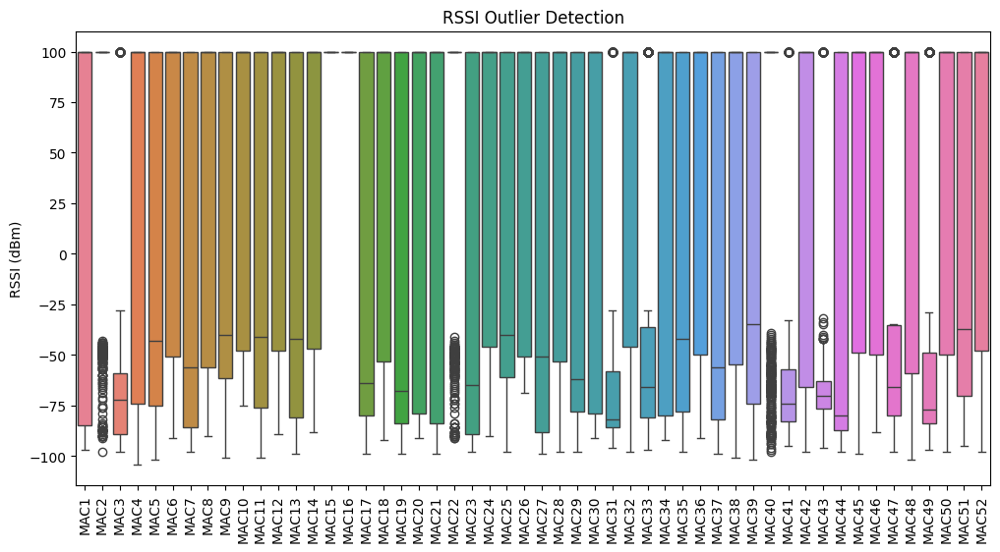

In [ ]:
# Outlier Detection in RSSI Values

# Identify extreme outliers
outliers = data[(data[rssi_columns] < -100) | (data[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)

# Plot RSSI boxplots to visualize anomalies
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Outlier Detection")
plt.ylabel("RSSI (dBm)")
plt.show()



RSSI Data Summary:
              MAC1        MAC2        MAC3        MAC4        MAC5        MAC6  \
count  955.000000  955.000000  955.000000  955.000000  955.000000  955.000000   
mean    13.113089   74.921466  -57.991623   32.068063    6.800000   47.804188   
std     89.007077   58.465305   53.356794   85.860953   85.955676   77.506153   
min    -97.000000  -98.000000  -98.000000 -104.000000 -102.000000  -91.000000   
25%    -85.000000  100.000000  -89.000000  -74.000000  -75.000000  -51.000000   
50%    100.000000  100.000000  -72.000000  100.000000  -43.000000  100.000000   
75%    100.000000  100.000000  -59.000000  100.000000  100.000000  100.000000   
max    100.000000  100.000000  100.000000  100.000000  100.000000  100.000000   

             MAC7        MAC8        MAC9       MAC10  ...       MAC43  \
count  955.000000  955.000000  955.000000  955.000000  ...  955.000000   
mean   -22.961257   43.636649    4.090052   46.814660  ...  -57.990576   
std     77.926937   76.3343

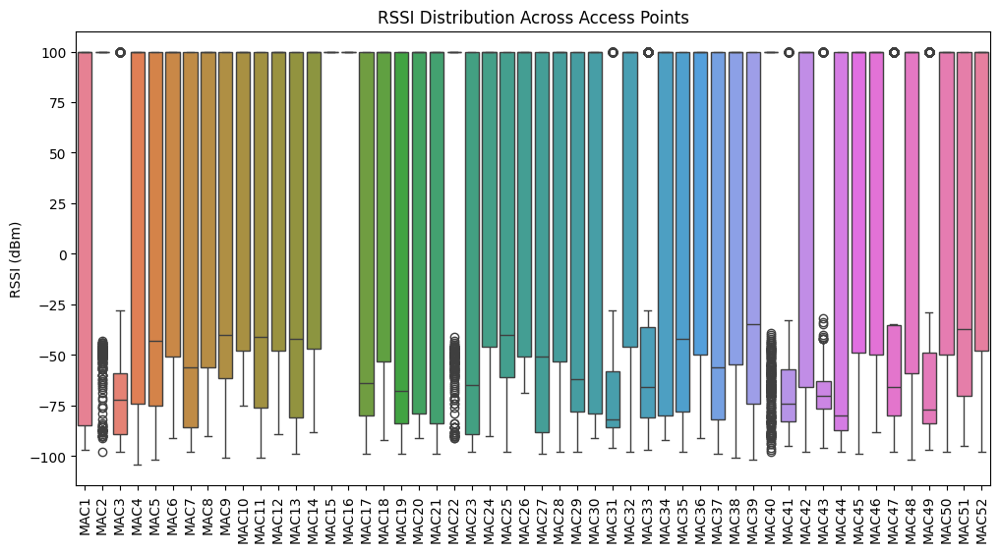

In [ ]:
# RSSI Distribution Across APs

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())

# Boxplot of RSSI values
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Distribution Across Access Points")
plt.ylabel("RSSI (dBm)")
plt.show()


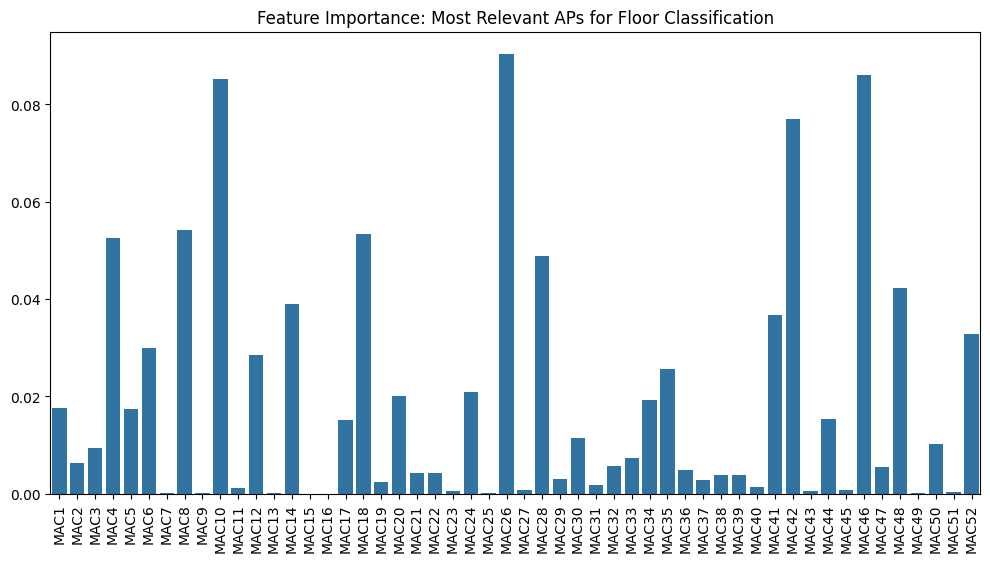

In [ ]:
#  Feature Importance for Localization

from sklearn.ensemble import RandomForestClassifier

# Prepare dataset
X = data[rssi_columns]  # RSSI values
y = data["FloorID"]  # Target variable

# Train a simple classifier to get feature importance
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)

# Plot feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x=rssi_columns, y=clf.feature_importances_)
plt.xticks(rotation=90)
plt.title("Feature Importance: Most Relevant APs for Floor Classification")
plt.show()


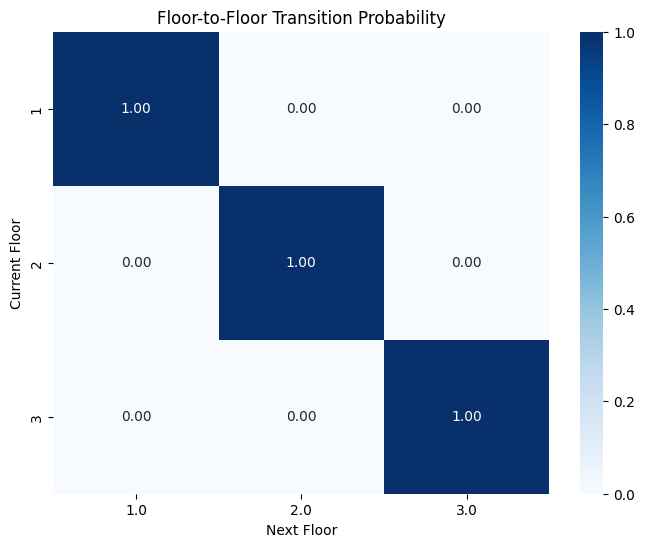

In [ ]:
# Floor-to-Floor Transition Probability (Optional)

import pandas as pd
import seaborn as sns

# Compute floor transition probabilities
floor_transitions = pd.crosstab(data["FloorID"], data["FloorID"].shift(-1), normalize='index')

# Plot as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(floor_transitions, annot=True, cmap="Blues", fmt=".2f")
plt.title("Floor-to-Floor Transition Probability")
plt.xlabel("Next Floor")
plt.ylabel("Current Floor")
plt.show()


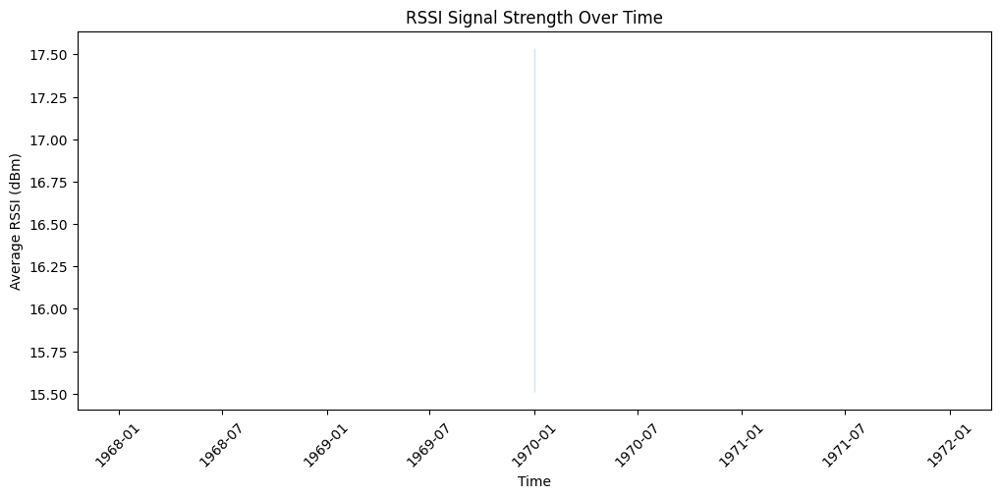

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["SampleTimes"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


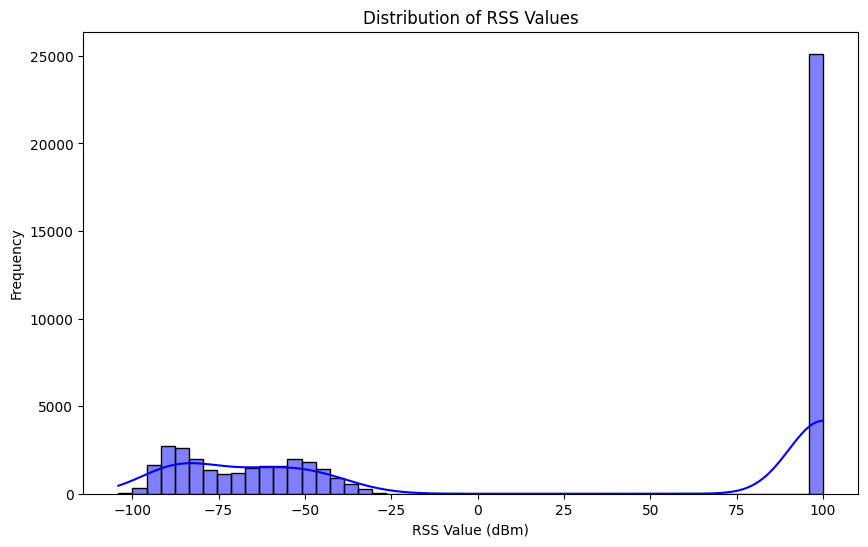

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data.iloc[:, :52].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
plt.title('Distribution of RSS Values')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.savefig('rssi_distribution_cetc.png', dpi=300, bbox_inches='tight')

plt.show()


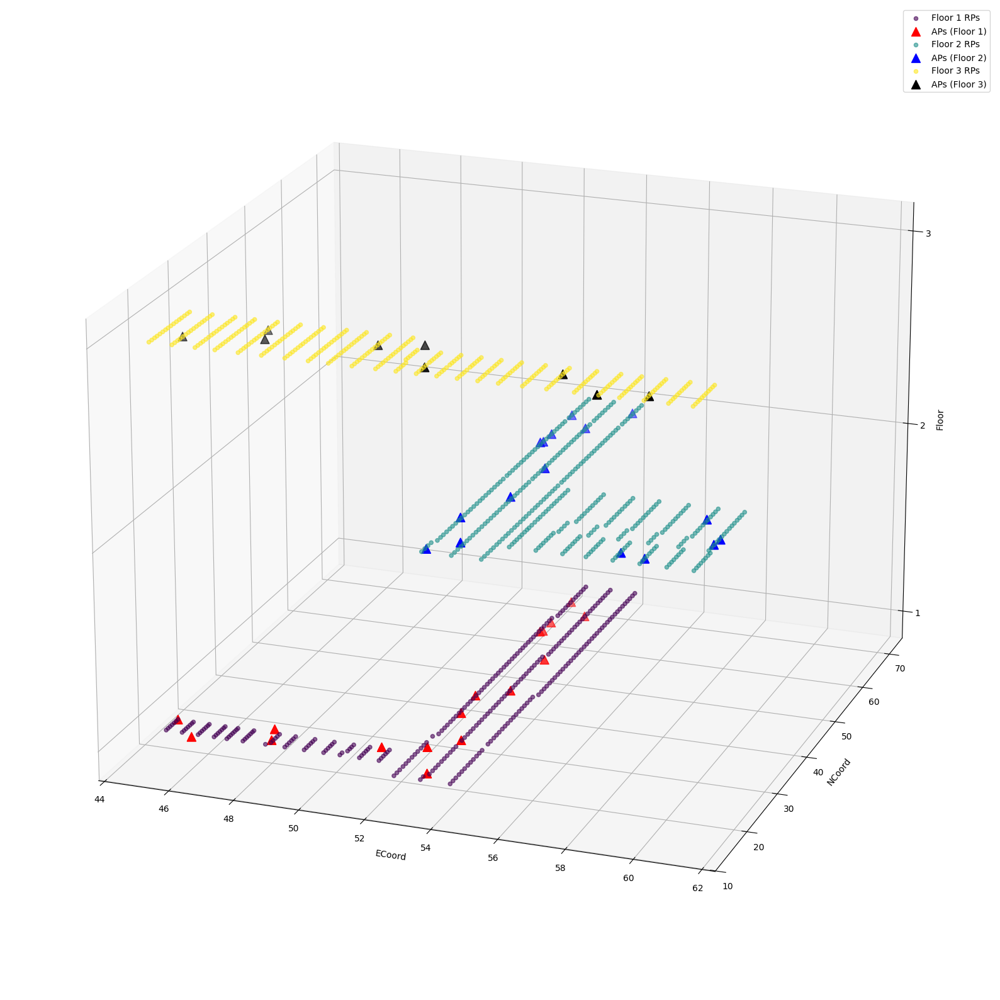

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plotting
from mpl_toolkits.mplot3d.art3d import Poly3DCollection


# data = pd.read_csv("/content/drive/MyDrive/DATASETS/2. SODloc /SODIndoorLoc-main/CETC331/Training_CETC331.csv")
# data = data.drop(columns=["BuildingID", "UserID", "PhoneID", "SampleTimes"])
# # data = data.replace(100, -105)
# # data['FloorID'] = data['FloorID'].astype(int)
# # Define AP positions
waps_positions = [
    ['MAC1', 48.152, 18.698],  ['MAC2', 48.152, 18.698],  ['MAC3', 53.279, 25.209],
    ['MAC4', 53.279, 25.209],  ['MAC5', 52.538, 55.978],  ['MAC6', 52.538, 55.978],
    ['MAC7', 59.818, 15.362],  ['MAC8', 59.818, 15.362],  ['MAC9', 45.89, 16.729],
    ['MAC10', 45.89, 16.729],  ['MAC11', 51.318, 20.785], ['MAC12', 51.318, 20.785],
    ['MAC13', 53.224, 16.047], ['MAC14', 53.224, 16.047], ['MAC15', 57.003, 18.658],
    ['MAC16', 57.003, 18.658], ['MAC17', 53.32, 39.345],  ['MAC18', 53.32, 39.345],
    ['MAC19', 52.603, 58.859], ['MAC20', 52.603, 58.859], ['MAC21', 45.008, 20.451],
    ['MAC22', 45.008, 20.451], ['MAC23', 60.091, 33.229], ['MAC24', 60.091, 33.229],
    ['MAC25', 58.452, 14.043], ['MAC26', 58.452, 14.043], ['MAC27', 60.141, 34.836],
    ['MAC28', 60.141, 34.836], ['MAC29', 53.436, 48.605], ['MAC30', 53.436, 48.605],
    ['MAC31', 57.825, 27.932], ['MAC32', 57.825, 27.932], ['MAC33', 52.603, 56.296],
    ['MAC34', 52.603, 56.296], ['MAC35', 53.386, 61.796], ['MAC36', 53.386, 61.796],
    ['MAC37', 54.273, 68.044], ['MAC38', 54.273, 68.044], ['MAC39', 52.604, 65.286],
    ['MAC40', 52.604, 65.286], ['MAC41', 52.56, 31.939],  ['MAC42', 52.56, 31.939],
    ['MAC43', 52.548, 22.369], ['MAC44', 52.548, 22.369], ['MAC45', 47.925, 21.455],
    ['MAC46', 47.925, 21.455], ['MAC47', 52.482, 36.853], ['MAC48', 52.482, 36.853],
    ['MAC49', 58.605, 27.193], ['MAC50', 58.605, 27.193], ['MAC51', 59.269, 39.841],
    ['MAC52', 59.269, 39.841],
]
anchors = pd.DataFrame(waps_positions, columns=['MAC_ID', 'ECoord_AP', 'NCoord_AP'])

anchors = pd.DataFrame(waps_positions, columns=['MAC_ID', 'ECoord_AP', 'NCoord_AP'])

# Colors for RPs and APs on each floor
floor_colors = {1: '#440154', 2: '#21918C', 3: '#FDE725'}
ap_floor_colors = {1: 'red', 2: 'blue', 3: 'black'}  # distinct AP color per floor

z_scale = 1

fig = plt.figure(figsize=(24, 16))
ax = fig.add_subplot(111, projection='3d')

for floor, rp_color in floor_colors.items():
    floor_data = data[data['FloorID'] == floor]

    # Plot RPs
    ax.scatter(
        floor_data['ECoord'],
        floor_data['NCoord'],
        floor * z_scale,
        c=rp_color,
        label=f'Floor {floor} RPs',
        alpha=0.6
    )

    if not floor_data.empty:
        min_E = floor_data['ECoord'].min()
        max_E = floor_data['ECoord'].max()
        min_N = floor_data['NCoord'].min()
        max_N = floor_data['NCoord'].max()
        floor_anchors = anchors[
            (anchors['ECoord_AP'] >= min_E) & (anchors['ECoord_AP'] <= max_E) &
            (anchors['NCoord_AP'] >= min_N) & (anchors['NCoord_AP'] <= max_N)
        ]
        # Plot APs with a distinct color for each floor
        ax.scatter(
            floor_anchors['ECoord_AP'],
            floor_anchors['NCoord_AP'],
            floor * z_scale,
            c=ap_floor_colors[floor],
            marker='^',
            s=100,
            label=f'APs (Floor {floor})'
        )

ax.view_init(elev=20, azim=-70)

ax.set_xlabel('ECoord')
ax.set_ylabel('NCoord')
ax.set_zlabel('Floor')

if z_scale == 1:
    ax.set_zticks([1, 2, 3])
    # ax.set_zticklabels(['Floor 1', 'Floor 2', 'Floor 3'])

# ax.legend(loc='upper left', bbox_to_anchor=(0.01, 0.15))

ax.legend()
plt.tight_layout()
plt.savefig('spatial_distribution_cetc.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-31-2d82a80f3c3e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


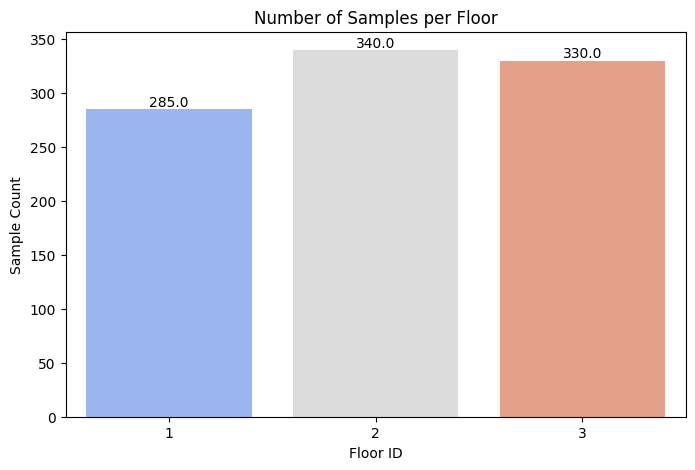

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count samples per floor
floor_counts = data["FloorID"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title("Number of Samples per Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")

plt.show()


<ipython-input-32-4f50b98527db>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=building_counts.index, y=building_counts.values, palette="Blues_r")


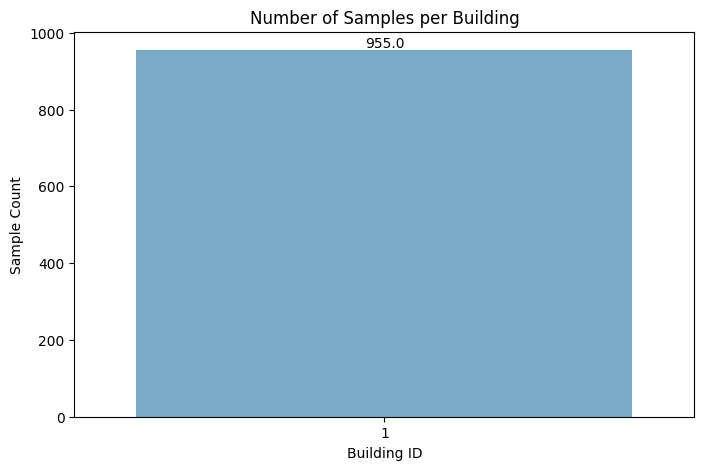

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count samples per building
building_counts = data["BuildingID"].value_counts()

# Bar chart of samples per building
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=building_counts.index, y=building_counts.values, palette="Blues_r")

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title("Number of Samples per Building")
plt.xlabel("Building ID")
plt.ylabel("Sample Count")

plt.show()



Devices used for collection: [3]


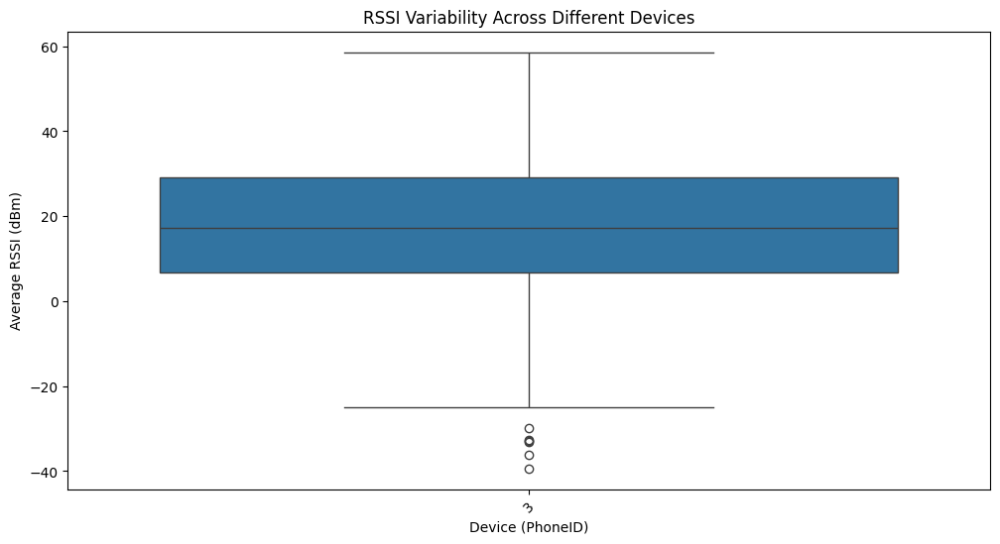

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PhoneID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PhoneID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PhoneID)")
plt.ylabel("Average RSSI (dBm)")
plt.show()



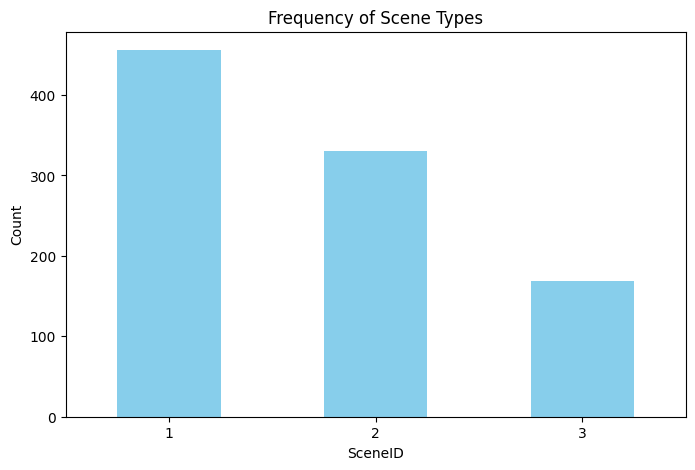

In [ ]:
# Plot the frequency of SceneID
scene_counts = data['SceneID'].value_counts()
scene_counts.plot(kind='bar', figsize=(8, 5), color='skyblue')
plt.title('Frequency of Scene Types')
plt.xlabel('SceneID')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


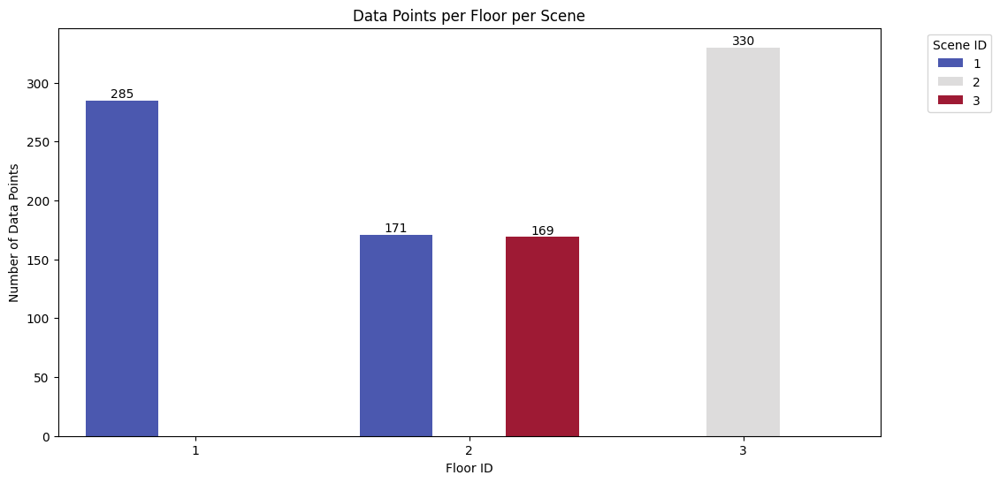

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count data points per FloorID and SceneID
floor_scene_counts = data.groupby(["FloorID", "SceneID"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="FloorID", y="Count", hue="SceneID", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10)

# Labels and title
plt.xlabel("Floor ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per Floor per Scene")
plt.legend(title="Scene ID", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show plot
plt.show()


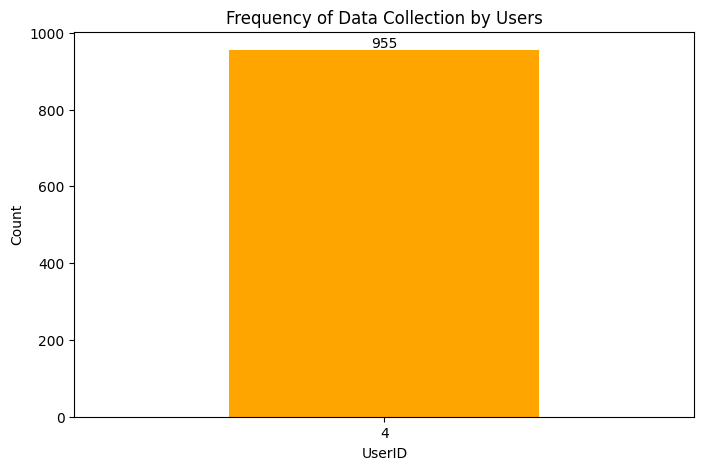

In [ ]:
import matplotlib.pyplot as plt

# Count occurrences of each UserID
user_counts = data['UserID'].value_counts()

# Create bar chart
plt.figure(figsize=(8, 5))
ax = user_counts.plot(kind='bar', color='orange')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()


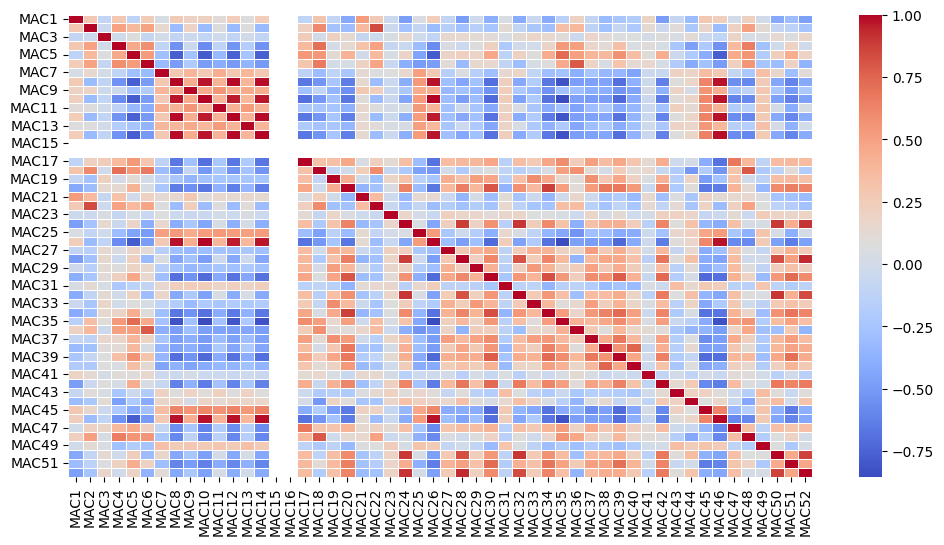

In [ ]:
# Correlation Between APs (MAC Addresses)

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs
plt.figure(figsize=(12, 6))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, linewidths=0.5)
# plt.title("Correlation Between RSSI Values of Different APs")
plt.savefig('rssi_correlation_cetc.png', dpi=300, bbox_inches='tight')

plt.show()


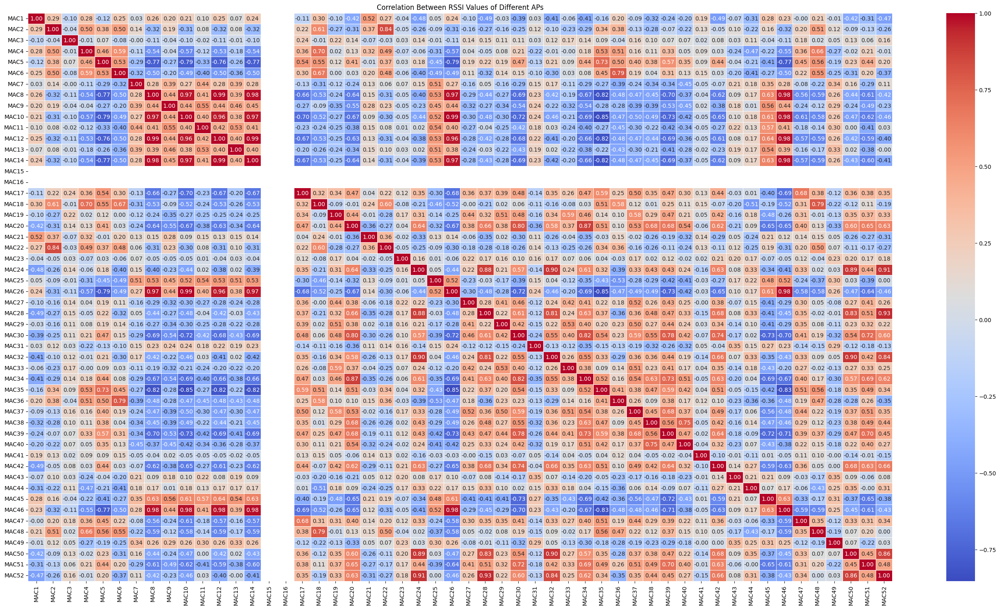

In [ ]:
import seaborn as sns

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs with annotations
plt.figure(figsize=(34, 18))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)

# Title
plt.title("Correlation Between RSSI Values of Different APs")

plt.show()


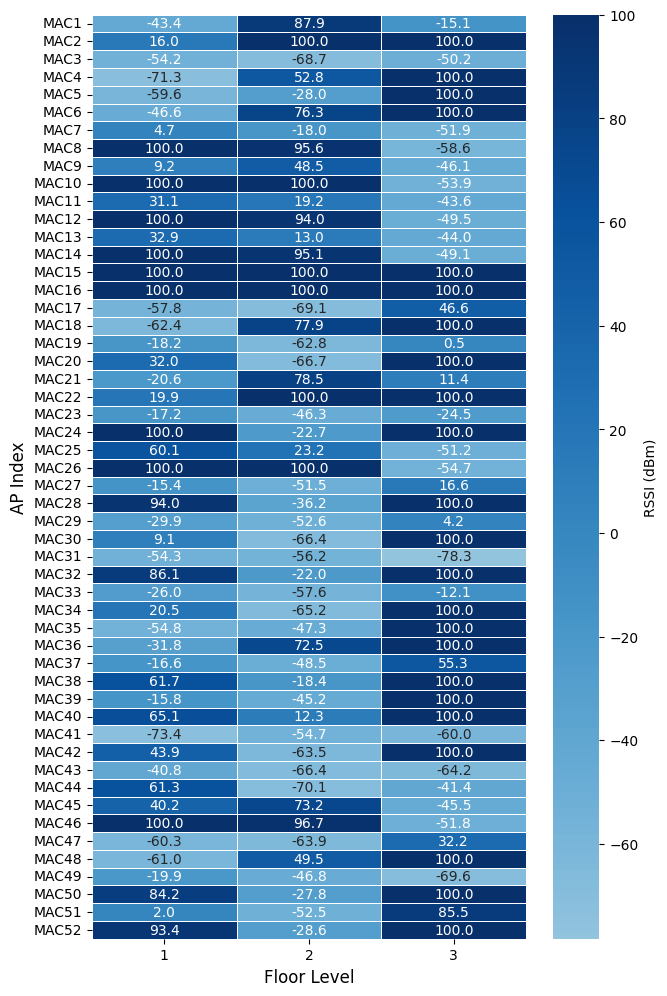

In [ ]:
# ===========================
# 4. AP Signal Coverage per Floor (WITH VALUES)
# ===========================
floor_column = 'FloorID'  # Define floor_column as 'FloorID'
rssi_columns = [col for col in data.columns if "MAC" in col]

floor_rssi_means = data.groupby(floor_column)[rssi_columns].mean()

plt.figure(figsize=(7, 12))
sns.heatmap(
    floor_rssi_means.T,
    cmap="Blues",
    center=-50,
    annot=True,  # Display values
    fmt=".1f",   # Format values to 1 decimal place
    linewidths=0.5,  # Add grid lines
    cbar_kws={'label': 'RSSI (dBm)'}  # Label for the color bar
)

# plt.title("Average RSSI per AP Across Floors", fontsize=16)
plt.xlabel("Floor Level", fontsize=12)
plt.ylabel("AP Index", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('avg_rssi_per_room_cetc.png', dpi=300, bbox_inches='tight')
plt.show()

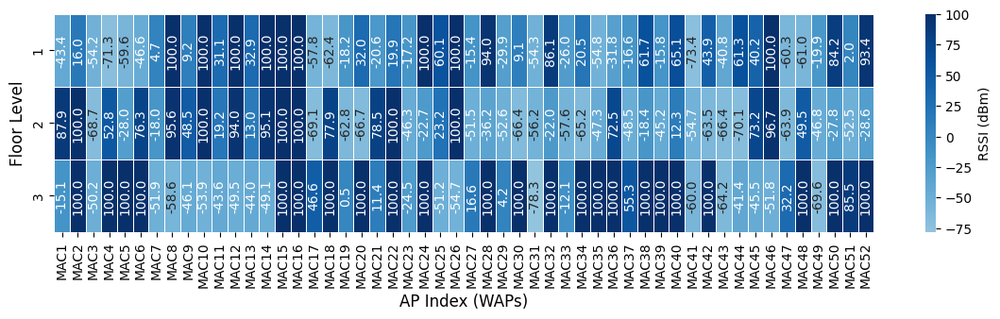

### HCXY BUILDING

In [ ]:
# Path to the directory containing CSV files
data_directory = "/content/drive/MyDrive/DATASETS/2. SODloc /SODIndoorLoc-main/HCXY/pre installed AP only/Training_HCXY_AP_30.csv"
data = pd.read_csv(data_directory)

# # Identify WAP columns and other columns
# wap_columns = sorted([col for col in data.columns if col.startswith('MAC')],
#                      key=lambda x: int(x.replace('MAC', '')))
# #other_columns = [col for col in data.columns if not col.startswith('MAC')]
# # Reorder the DataFrame
# data = data[wap_columns + other_columns]

data.head()

,MAC302,MAC314,MAC317,MAC327,MAC333,MAC230,MAC308,MAC324,MAC228,MAC335,...,MAC113,MAC211,ECoord,NCoord,FloorID,BuildingID,SceneID,UserID,PhoneID,SampleTimes
0,100,100,100,100,100,100,100,100,100,100,...,100,100,858.542,917.094,4,2,1,5,4,1
1,100,100,100,100,100,100,100,100,100,100,...,100,100,858.542,917.094,4,2,1,5,4,2
2,100,100,100,100,100,100,100,100,100,100,...,100,100,858.542,917.094,4,2,1,5,4,3
3,100,100,100,100,100,100,100,100,100,100,...,100,100,858.542,917.094,4,2,1,5,4,4
4,100,100,100,100,100,100,100,100,100,100,...,100,100,858.542,917.094,4,2,1,5,4,5


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["ECoord"].min(), data["ECoord"].max()
y_min, y_max = data["NCoord"].min(), data["NCoord"].max()

print(f"ECoord_min: {x_min}, ECoord_max: {x_max}")
print(f"NCoord_min: {y_min}, NCoord_max: {y_max}\n")
len(rssi_columns)

ECoord_min: 857.803, ECoord_max: 975.127
NCoord_min: 878.257, NCoord_max: 919.259



46

In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'MAC' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:
# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'MAC' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -97 dBm
Maximum RSSI: 100 dBm
RSSI Range: 197 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11370 entries, 0 to 11369
Data columns (total 64 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MAC302       11370 non-null  int64  
 1   MAC314       11370 non-null  int64  
 2   MAC317       11370 non-null  int64  
 3   MAC327       11370 non-null  int64  
 4   MAC333       11370 non-null  int64  
 5   MAC230       11370 non-null  int64  
 6   MAC308       11370 non-null  int64  
 7   MAC324       11370 non-null  int64  
 8   MAC228       11370 non-null  int64  
 9   MAC335       11370 non-null  int64  
 10  MAC232       11370 non-null  int64  
 11  MAC276       11370 non-null  int64  
 12  MAC154       11370 non-null  int64  
 13  MAC135       11370 non-null  int64  
 14  MAC121       11370 non-null  int64  
 15  MAC217       11370 non-null  int64  
 16  MAC207       11370 non-null  int64  
 17  MAC208       11370 non-null  int64  
 18  MAC7         11370 non-null  int64  
 19  MAC3

In [ ]:
# Summary statistics
print(data.describe())

             MAC302        MAC314        MAC317        MAC327        MAC333  \
count  11370.000000  11370.000000  11370.000000  11370.000000  11370.000000   
mean      50.820405     65.954090     70.377133     62.074758     68.972647   
std       72.779751     64.311683     62.331526     67.607293     61.440212   
min      -78.000000    -89.000000    -85.000000    -76.000000    -77.000000   
25%      -50.000000    100.000000    100.000000    100.000000    100.000000   
50%      100.000000    100.000000    100.000000    100.000000    100.000000   
75%      100.000000    100.000000    100.000000    100.000000    100.000000   
max      100.000000    100.000000    100.000000    100.000000    100.000000   

             MAC230        MAC308        MAC324        MAC228        MAC335  \
count  11370.000000  11370.000000  11370.000000  11370.000000  11370.000000   
mean      67.273087     57.287423     62.819437     67.035268     99.558839   
std       62.748455     71.129168     66.548870    

In [ ]:
# Check unique values for categorical columns
print(f'unique Scenes: {data["SceneID"].unique()}')
print(f'unique Floors: {data["FloorID"].unique()}')
print(f'unique Users:{data["UserID"].unique()}')
print(f'unique Phones:{data["PhoneID"].unique()}')

unique Scenes: [1]
unique Floors: [4]
unique Users:[ 5  6  7  8  9 10]
unique Phones:[4 5 6 7 8 9]


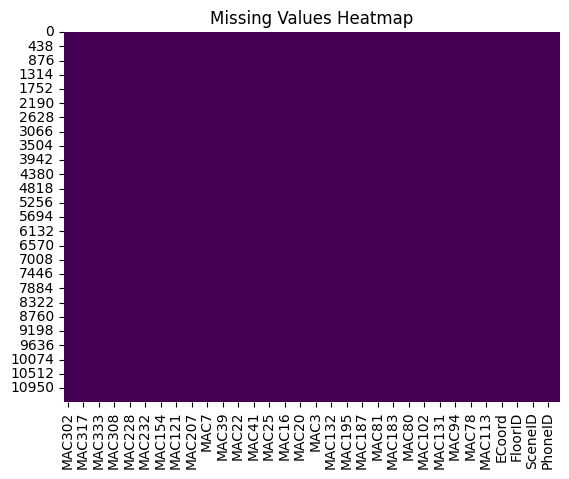

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


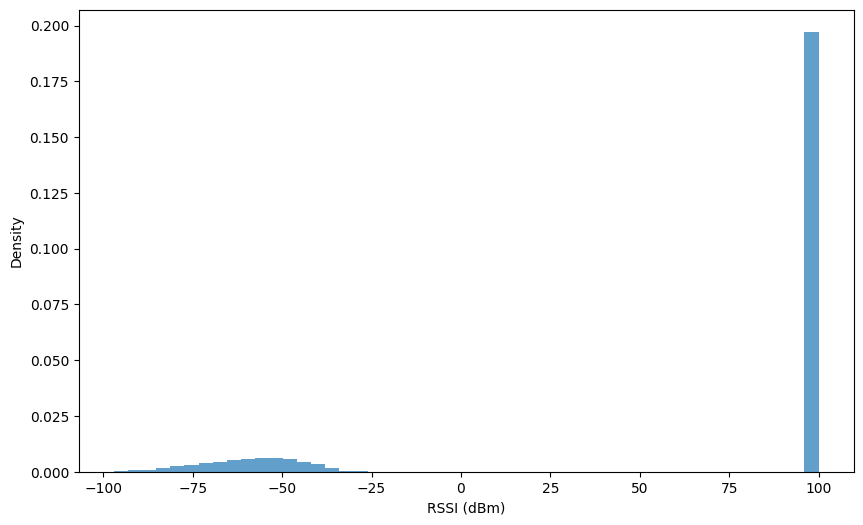

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution hcxy")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_h.png', dpi=300, bbox_inches='tight')
plt.show()

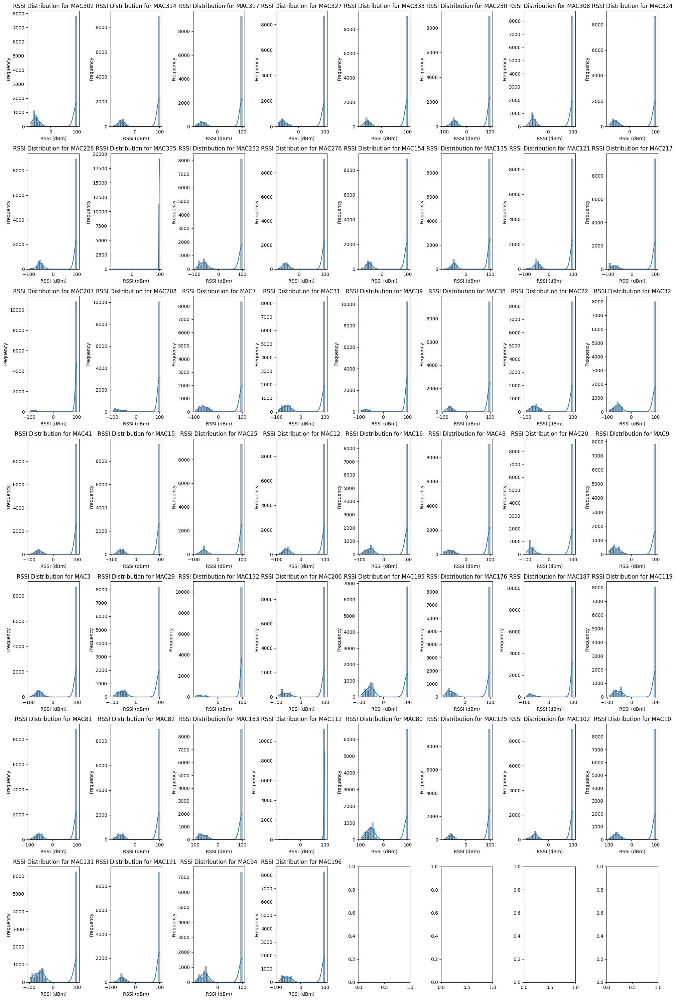

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=7, ncols=8, figsize=(20, 30))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:52]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distributions_per_wap_h.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-54-111202891bb6>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


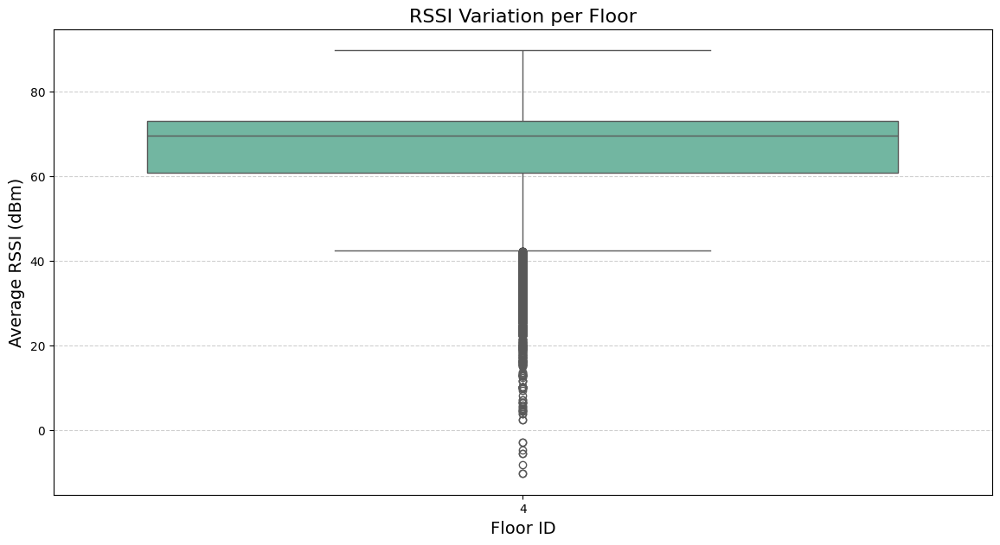

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FloorID',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig('rssi_variation_floor_h.png', dpi=300, bbox_inches='tight')
plt.show()

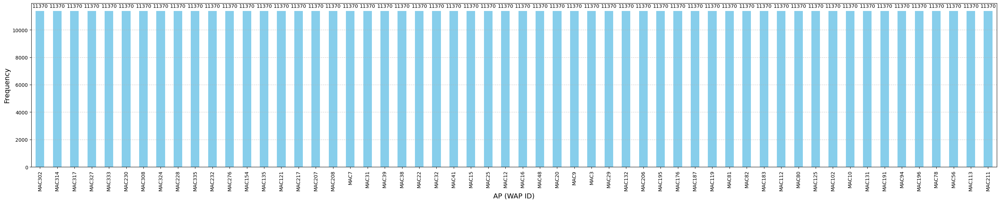

In [ ]:
# AP Utilization & Coverage Analysis
# AP detection frequency
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

plt.figure(figsize=(35, 6))
ax = ap_usage.plot(kind='bar', color='skyblue')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(
        str(int(p.get_height())),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10, xytext=(0, 5),
        textcoords='offset points'
    )

# plt.title("AP Detection Frequency", fontsize=16)
plt.xlabel("AP (WAP ID)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.savefig('ap_detection_frequency_h.png', dpi=300, bbox_inches='tight')
plt.show()

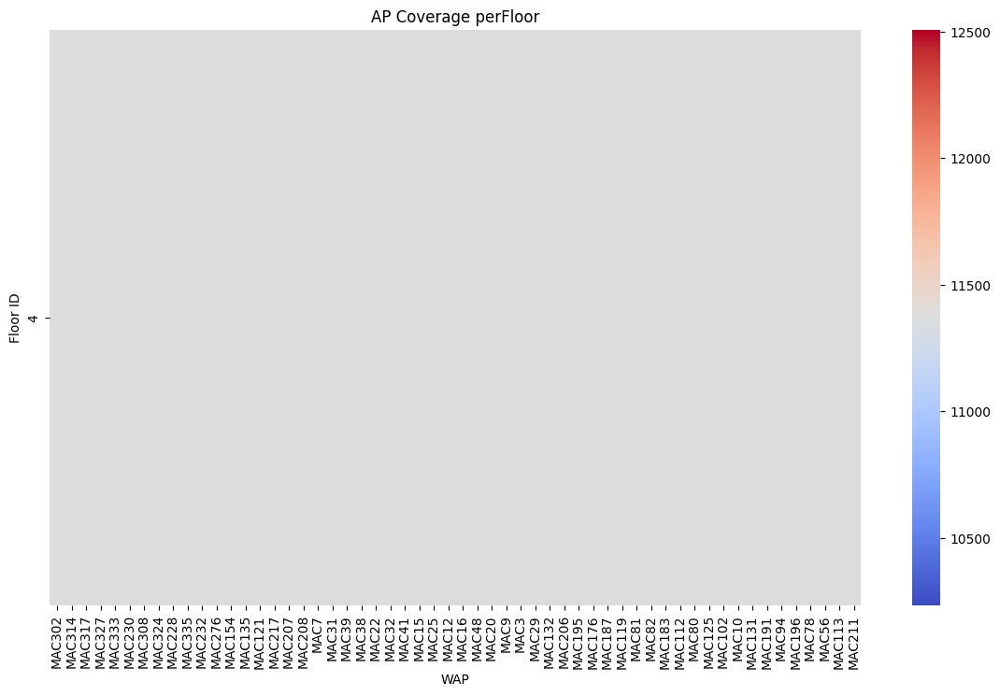

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FloorID')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
plt.savefig('ap_coverage_per_floor_h.png', dpi=300, bbox_inches='tight')
plt.show()

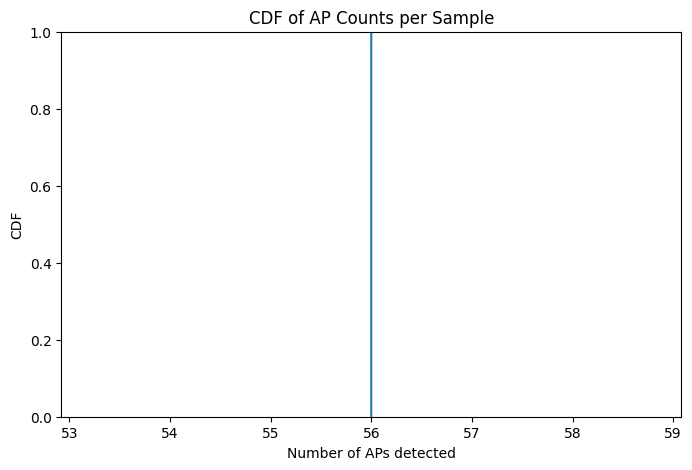

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_h.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
        MAC302  MAC314  MAC317  MAC327  MAC333  MAC230  MAC308  MAC324  MAC228  \
0       100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   
1       100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   
2       100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   
3       100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   
4       100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   100.0   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
11365     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
11366     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
11367     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
11368     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
11369     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

      

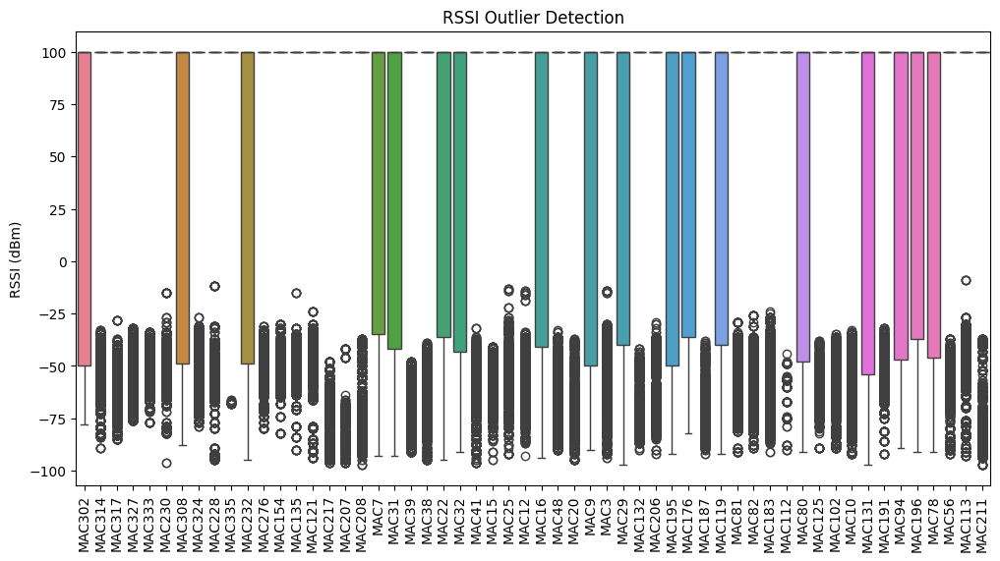

In [ ]:
# Outlier Detection in RSSI Values

# Identify extreme outliers
outliers = data[(data[rssi_columns] < -100) | (data[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)

# Plot RSSI boxplots to visualize anomalies
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Outlier Detection")
plt.ylabel("RSSI (dBm)")
plt.show()



RSSI Data Summary:
              MAC302        MAC314        MAC317        MAC327        MAC333  \
count  11370.000000  11370.000000  11370.000000  11370.000000  11370.000000   
mean      50.820405     65.954090     70.377133     62.074758     68.972647   
std       72.779751     64.311683     62.331526     67.607293     61.440212   
min      -78.000000    -89.000000    -85.000000    -76.000000    -77.000000   
25%      -50.000000    100.000000    100.000000    100.000000    100.000000   
50%      100.000000    100.000000    100.000000    100.000000    100.000000   
75%      100.000000    100.000000    100.000000    100.000000    100.000000   
max      100.000000    100.000000    100.000000    100.000000    100.000000   

             MAC230        MAC308        MAC324        MAC228        MAC335  \
count  11370.000000  11370.000000  11370.000000  11370.000000  11370.000000   
mean      67.273087     57.287423     62.819437     67.035268     99.558839   
std       62.748455     71.129

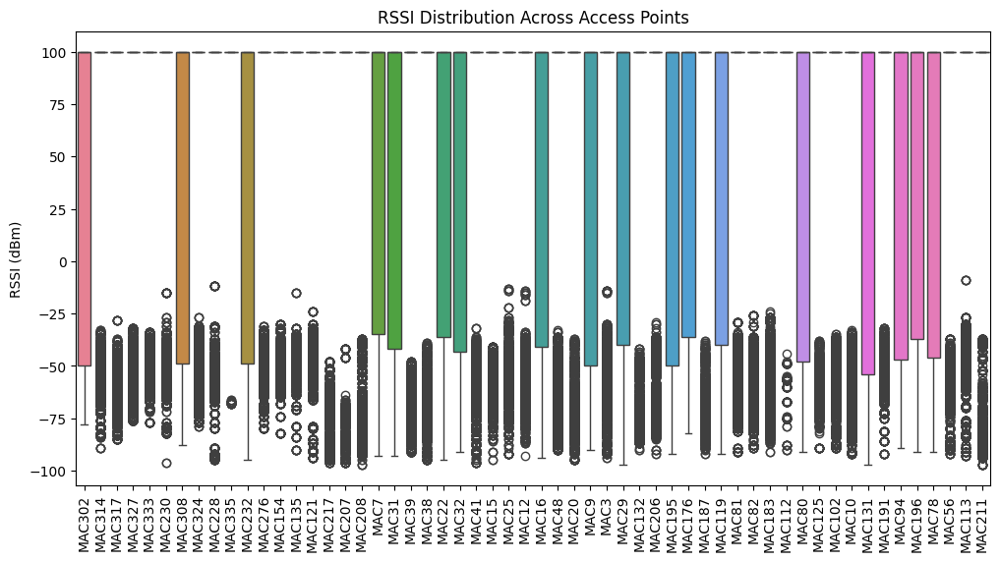

In [ ]:
# RSSI Distribution Across APs

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())

# Boxplot of RSSI values
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Distribution Across Access Points")
plt.ylabel("RSSI (dBm)")
plt.show()


<ipython-input-65-fb2e8d04ef17>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)


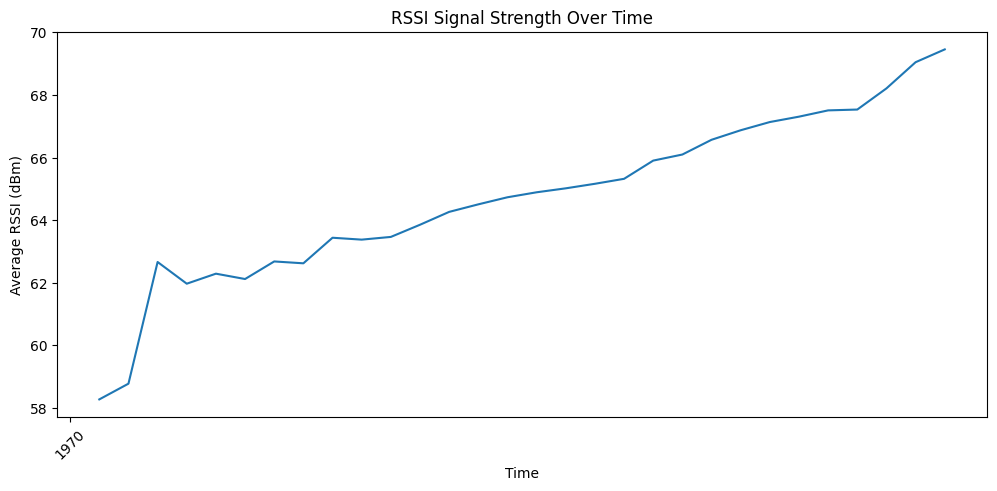

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["SampleTimes"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


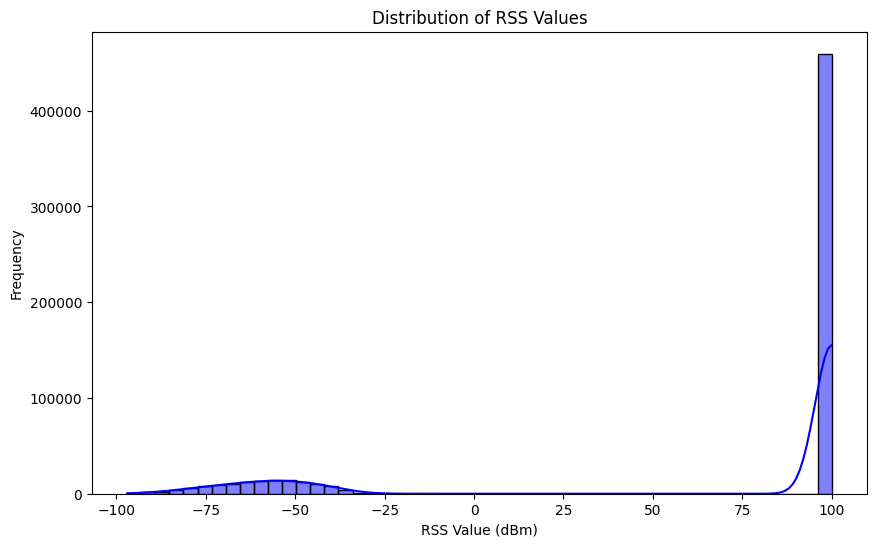

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data.iloc[:, :52].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
plt.title('Distribution of RSS Values')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.savefig('rssi_distribution_hxcy.png', dpi=300, bbox_inches='tight')

plt.show()


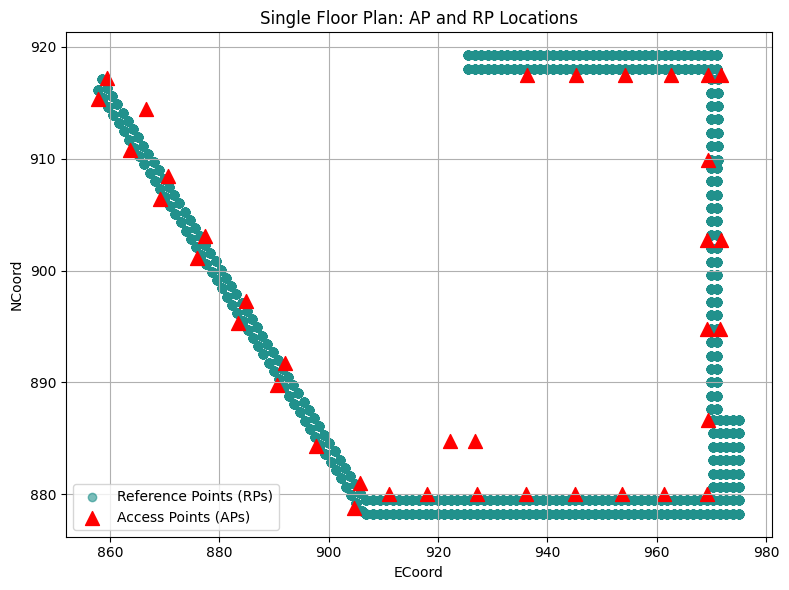

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Define AP positions
waps_positions = [
    ['MAC302', 969.288, 917.459],    ['MAC314', 954.288, 919.859],    ['MAC317', 968.948, 922.159],    ['MAC327', 962.688, 917.459],
    ['MAC333', 945.288, 917.459],    ['MAC230', 936.288, 917.459],    ['MAC308', 971.688, 917.459],    ['MAC324', 962.688, 919.859],
    ['MAC228', 936.288, 919.859],    ['MAC335', 954.288, 917.459],    ['MAC232', 945.288, 919.859],    ['MAC276', 969.191, 902.768],
    ['MAC154', 971.638, 894.799],    ['MAC135', 971.787, 902.724],    ['MAC121', 969.188, 894.799],    ['MAC217', 944.684, 871.128],
    ['MAC207', 936.101, 871.231],    ['MAC208', 944.686, 876.407],    ['MAC7', 905.719, 880.996],    ['MAC31', 897.622, 884.276],
    ['MAC39', 866.601, 914.477],    ['MAC38', 859.384, 917.197],    ['MAC22', 892.007, 891.709],    ['MAC32', 884.915, 897.249],
    ['MAC41', 869.253, 906.440],    ['MAC15', 863.707, 910.773],    ['MAC25', 870.575, 908.453],    ['MAC12', 876.000, 901.169],
    ['MAC16', 883.438, 895.358],    ['MAC48', 911.126, 880.067],    ['MAC20', 857.906, 915.306],    ['MAC9', 904.714, 878.735],
    ['MAC3', 877.478, 903.060],    ['MAC29', 890.530, 889.817],    ['MAC132', 922.268, 884.789],    ['MAC206', 954.288, 877.659],
    ['MAC195', 970.318, 877.659],    ['MAC176', 945.118, 880.059],    ['MAC187', 926.688, 884.789],    ['MAC119', 961.388, 880.059],
    ['MAC81', 936.088, 877.659],    ['MAC82', 936.036, 880.059],    ['MAC183', 953.688, 880.059],    ['MAC112', 917.988, 880.059],
    ['MAC80', 969.118, 880.059],    ['MAC125', 917.988, 877.659],    ['MAC102', 927.118, 877.659],    ['MAC10', 911.146, 877.659],
    ['MAC131', 969.288, 886.659],    ['MAC191', 927.288, 919.859],    ['MAC94', 975.588, 877.659],    ['MAC196', 945.118, 877.659],
    ['MAC78', 963.118, 877.659],    ['MAC56', 927.118, 880.059],    ['MAC113', 969.288, 909.919],    ['MAC211', 936.105, 876.538],
]

anchors = pd.DataFrame(waps_positions, columns=['MAC_ID', 'ECoord_AP', 'NCoord_AP'])

# Create the plot for a single floor
fig, ax = plt.subplots(figsize=(8, 6))

# Plot RPs
ax.scatter(data['ECoord'], data['NCoord'], c='#21918C', label='Reference Points (RPs)', alpha=0.6)

# Determine bounding box
min_E = data['ECoord'].min()
max_E = data['ECoord'].max()
min_N = data['NCoord'].min()
max_N = data['NCoord'].max()

# Filter APs that fall within the bounding box
floor_anchors = anchors[
    (anchors['ECoord_AP'] >= min_E) & (anchors['ECoord_AP'] <= max_E) &
    (anchors['NCoord_AP'] >= min_N) & (anchors['NCoord_AP'] <= max_N)
]

# Plot APs
ax.scatter(floor_anchors['ECoord_AP'], floor_anchors['NCoord_AP'], c='red', marker='^', s=100, label='Access Points (APs)')

ax.set_title('Single Floor Plan: AP and RP Locations')
ax.set_xlabel('ECoord')
ax.set_ylabel('NCoord')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig('spatial_distribution_hxcy.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-66-2d82a80f3c3e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


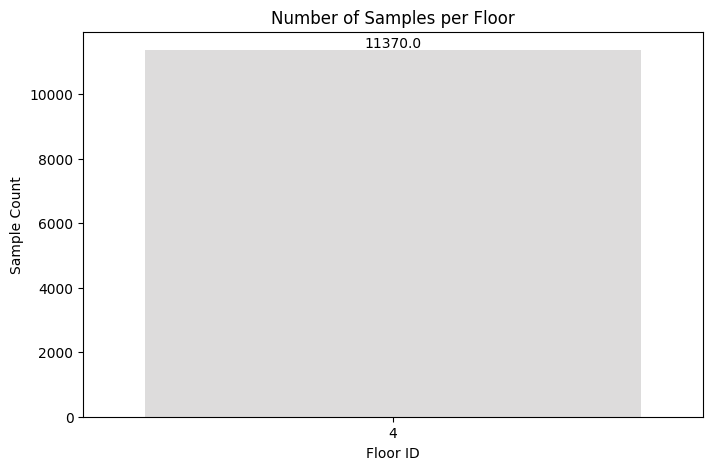

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count samples per floor
floor_counts = data["FloorID"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title("Number of Samples per Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")

plt.show()



Devices used for collection: [4 5 6 7 8 9]


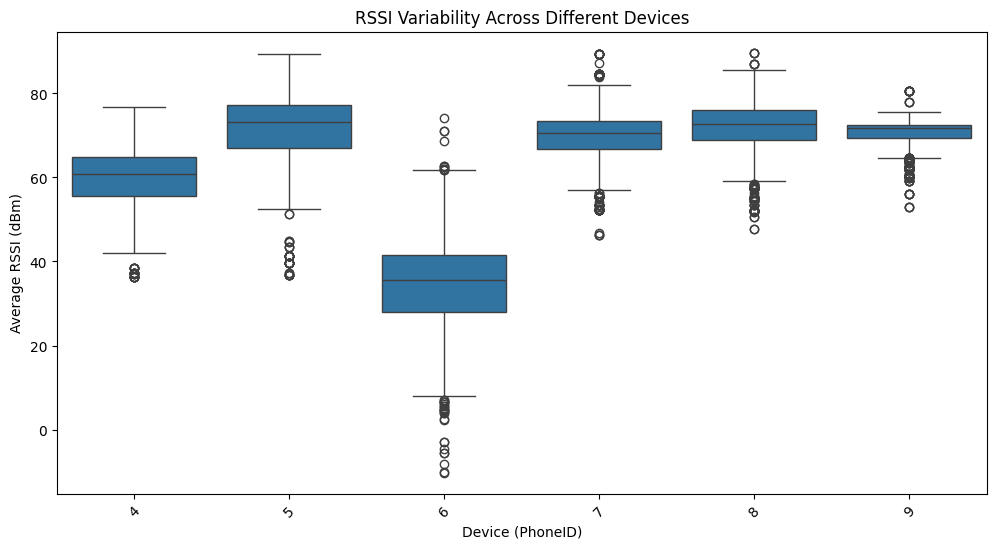

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PhoneID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PhoneID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PhoneID)")
plt.ylabel("Average RSSI (dBm)")
plt.show()



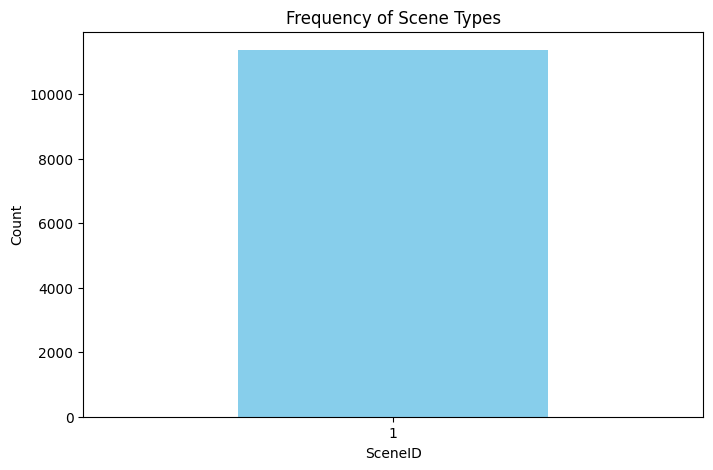

In [ ]:
# Plot the frequency of SceneID
scene_counts = data['SceneID'].value_counts()
scene_counts.plot(kind='bar', figsize=(8, 5), color='skyblue')
plt.title('Frequency of Scene Types')
plt.xlabel('SceneID')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


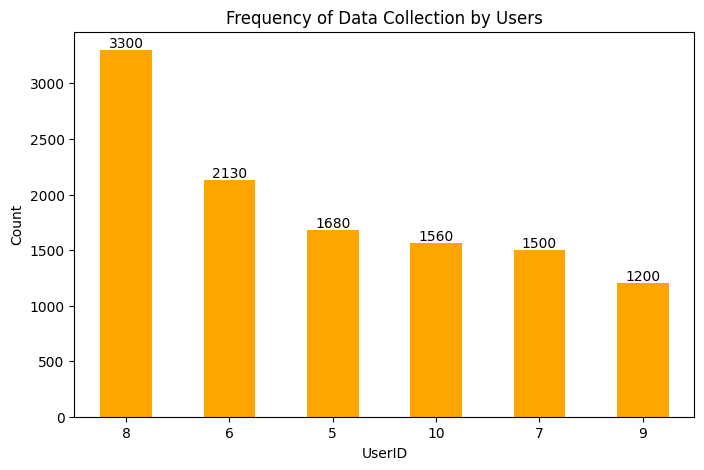

In [ ]:
import matplotlib.pyplot as plt

# Count occurrences of each UserID
user_counts = data['UserID'].value_counts()

# Create bar chart
plt.figure(figsize=(8, 5))
ax = user_counts.plot(kind='bar', color='orange')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()



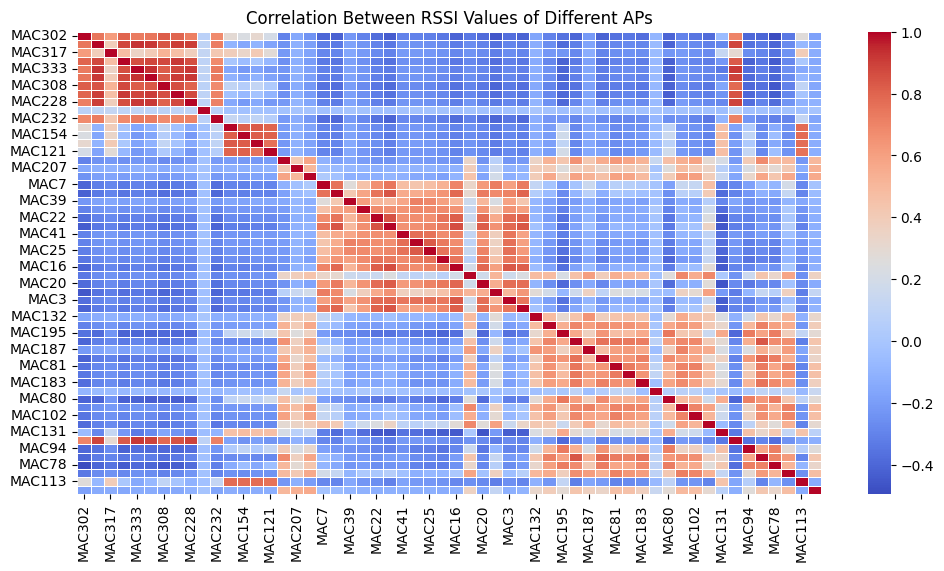

In [ ]:
# Correlation Between APs (MAC Addresses)

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs
plt.figure(figsize=(12, 6))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Correlation Between RSSI Values of Different APs")
plt.show()


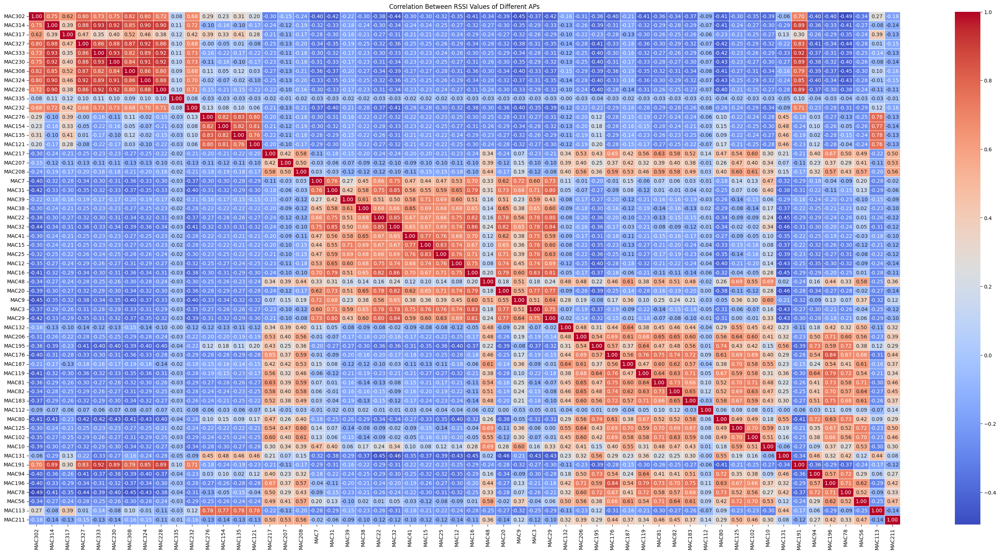

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs with annotations
plt.figure(figsize=(38, 18))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)

# Title
plt.title("Correlation Between RSSI Values of Different APs")

plt.show()


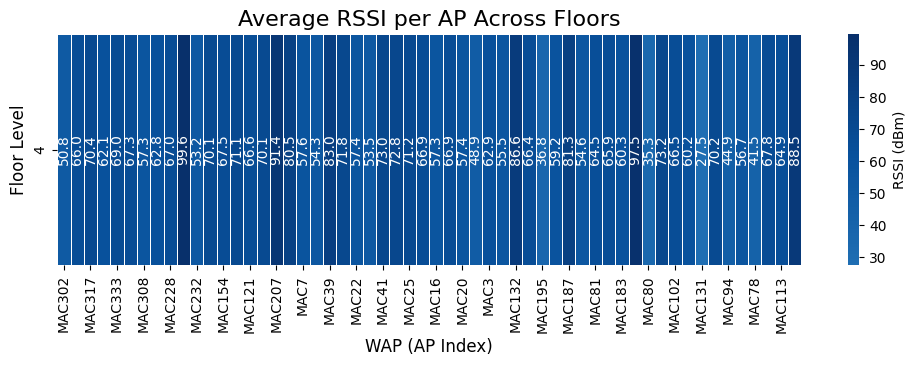

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define floor_column as 'FloorID'
floor_column = 'FloorID'

# Select columns that contain MAC addresses
rssi_columns = [col for col in data.columns if "MAC" in col]

# Compute the mean RSSI per floor
floor_rssi_means = data.groupby(floor_column)[rssi_columns].mean()

# Create the heatmap
plt.figure(figsize=(12, 3))
sns.heatmap(
    floor_rssi_means,  # WAPs on x-axis, Floors on y-axis
    cmap="Blues",
    center=-50,
    annot=True,  # Display values
    fmt=".1f",   # Format values to 1 decimal place
    linewidths=0.5,  # Add grid lines
    cbar_kws={'label': 'RSSI (dBm)'},  # Label for the color bar
    annot_kws={"rotation": 90},  # Rotate text vertically inside cells
)

plt.title("Average RSSI per AP Across Floors", fontsize=16)
plt.xlabel("WAP (AP Index)", fontsize=12)  # APs on x-axis
plt.ylabel("Floor Level", fontsize=12)  # Floors on y-axis
plt.xticks(rotation=90, fontsize=10)  # Rotate x-axis labels for readability
plt.yticks(fontsize=10)
plt.savefig('avg_rssi_per_room_hxcy.png', dpi=300, bbox_inches='tight')
plt.show()


### SYL BUILDING

In [ ]:
# Path to the directory containing CSV files
data_directory = "/content/drive/MyDrive/DATASETS/2. SODloc /SODIndoorLoc-main/SYL/Only pre installed AP/Training_SYL_AP_30.csv"
data = pd.read_csv(data_directory)
data.head()

,MAC125,MAC112,MAC47,MAC22,MAC226,MAC79,MAC18,MAC208,MAC12,MAC81,...,MAC23,MAC6,ECoord,NCoord,FloorID,BuildingID,SceneID,UserID,PhoneID,SampleTimes
0,100,100,100,-55,100,100,-74,100,100,100,...,-67,-49,19.03,20.05,4,3,1,1,1,1
1,100,100,100,-55,100,100,-74,100,100,100,...,-67,-49,19.03,20.05,4,3,1,1,1,2
2,100,100,100,-55,100,100,-74,100,100,100,...,-67,-49,19.03,20.05,4,3,1,1,1,3
3,100,100,100,-55,100,100,-74,100,100,100,...,-67,-49,19.03,20.05,4,3,1,1,1,4
4,100,100,100,-55,100,100,-74,100,100,100,...,-67,-49,19.03,20.05,4,3,1,1,1,5


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["ECoord"].min(), data["ECoord"].max()
y_min, y_max = data["NCoord"].min(), data["NCoord"].max()

print(f"ECoord_min: {x_min}, ECoord_max: {x_max}")
print(f"NCoord_min: {y_min}, NCoord_max: {y_max}")


ECoord_min: 19.03, ECoord_max: 82.43
NCoord_min: 2.05, NCoord_max: 31.03


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'MAC' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:

# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'MAC' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -92 dBm
Maximum RSSI: 100 dBm
RSSI Range: 192 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8880 entries, 0 to 8879
Data columns (total 54 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MAC125       8880 non-null   int64  
 1   MAC112       8880 non-null   int64  
 2   MAC47        8880 non-null   int64  
 3   MAC22        8880 non-null   int64  
 4   MAC226       8880 non-null   int64  
 5   MAC79        8880 non-null   int64  
 6   MAC18        8880 non-null   int64  
 7   MAC208       8880 non-null   int64  
 8   MAC12        8880 non-null   int64  
 9   MAC81        8880 non-null   int64  
 10  MAC224       8880 non-null   int64  
 11  MAC70        8880 non-null   int64  
 12  MAC90        8880 non-null   int64  
 13  MAC76        8880 non-null   int64  
 14  MAC120       8880 non-null   int64  
 15  MAC128       8880 non-null   int64  
 16  MAC17        8880 non-null   int64  
 17  MAC31        8880 non-null   int64  
 18  MAC63        8880 non-null   int64  
 19  MAC34 

In [ ]:
# Summary statistics
print(data.describe())

            MAC125       MAC112        MAC47        MAC22       MAC226  \
count  8880.000000  8880.000000  8880.000000  8880.000000  8880.000000   
mean     57.518468    47.770833    66.775113    43.995158    67.034797   
std      68.846378    72.084872    63.161003    74.440582    61.761603   
min     -77.000000   -77.000000   -82.000000   -79.000000   -69.000000   
25%     -38.000000   -46.000000   100.000000   -47.000000   100.000000   
50%     100.000000   100.000000   100.000000   100.000000   100.000000   
75%     100.000000   100.000000   100.000000   100.000000   100.000000   
max     100.000000   100.000000   100.000000   100.000000   100.000000   

             MAC79        MAC18       MAC208        MAC12        MAC81  ...  \
count  8880.000000  8880.000000  8880.000000  8880.000000  8880.000000  ...   
mean     39.654955    54.975901    59.440653    46.516667    36.586712  ...   
std      74.307133    71.434048    65.978520    73.334456    76.240210  ...   
min     -85.00000

In [ ]:
# Check unique values for categorical columns
print(f'unique Scenes: {data["SceneID"].unique()}')
print(f'unique Floors: {data["FloorID"].unique()}')
print(f'unique Users:{data["UserID"].unique()}')
print(f'unique Phones:{data["PhoneID"].unique()}')

unique Scenes: [1 2 3]
unique Floors: [4]
unique Users:[1 2 3]
unique Phones:[1 2]


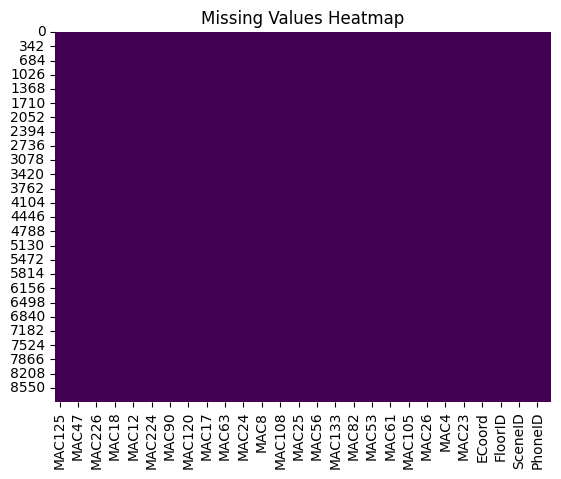

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


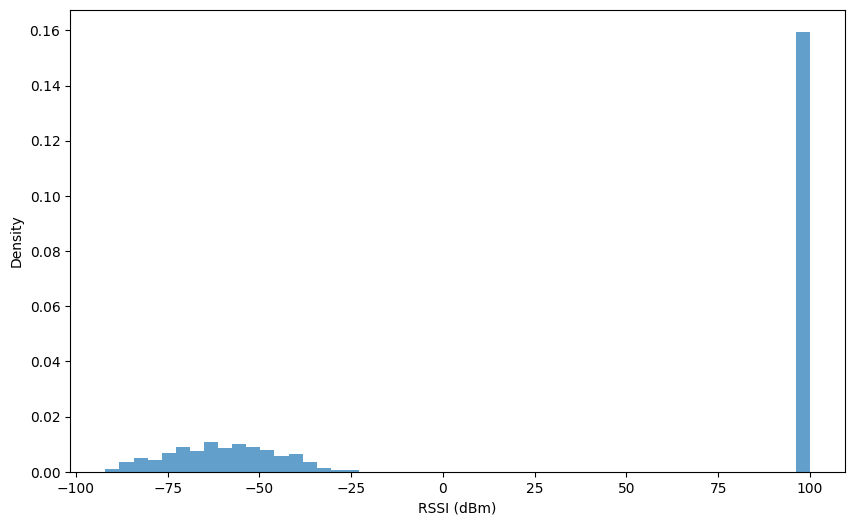

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution SYL")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_s.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
len(rssi_columns)

46

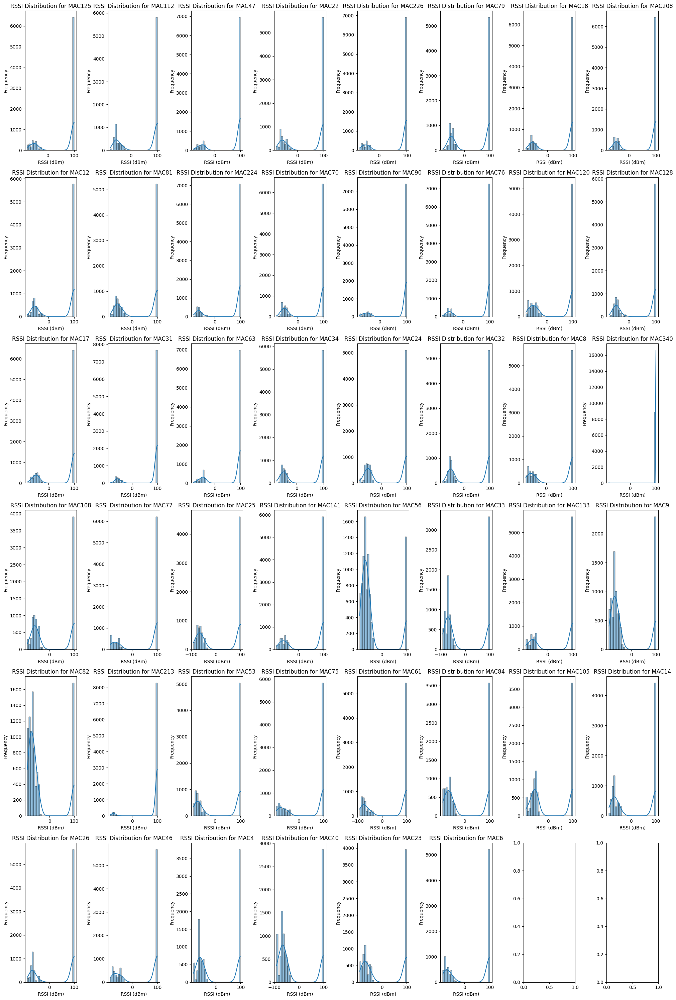

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=6, ncols=8, figsize=(20, 30))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:52]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distributions_per_wap_s.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-84-9fc19e6329ba>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


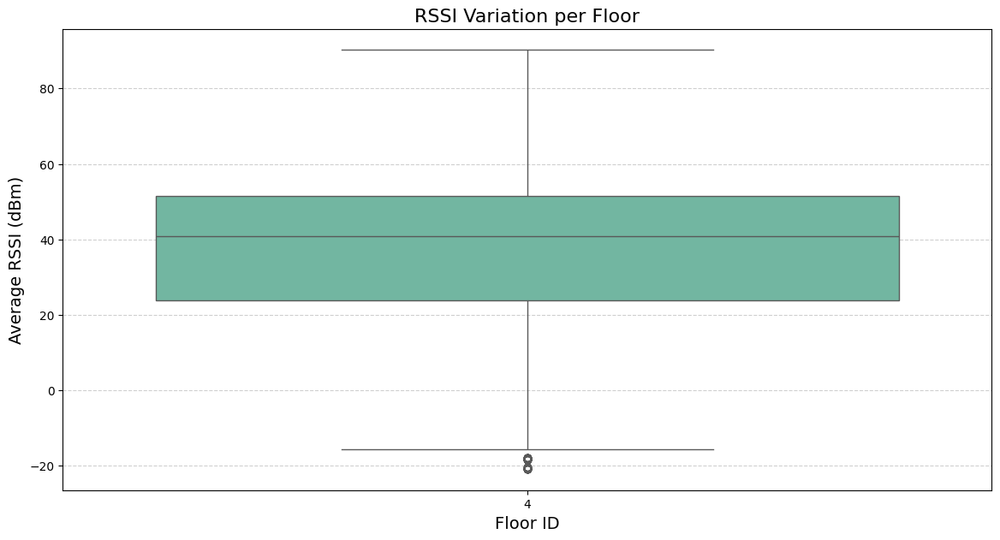

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FloorID',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig('rssi_variation_floor_s.png', dpi=300, bbox_inches='tight')
plt.show()

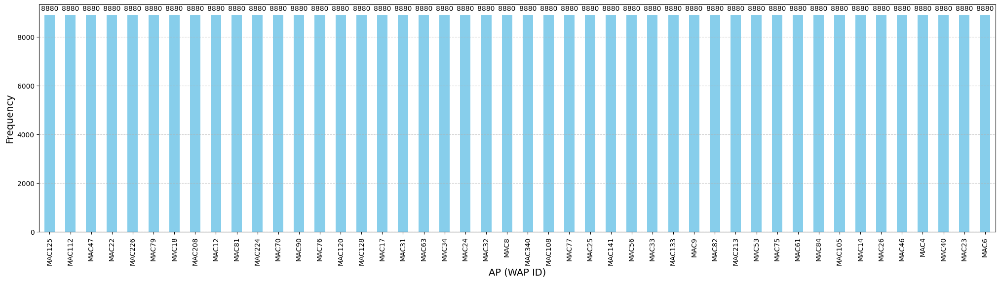

In [ ]:
# AP Utilization & Coverage Analysis
# AP detection frequency
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

plt.figure(figsize=(25, 6))
ax = ap_usage.plot(kind='bar', color='skyblue')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(
        str(int(p.get_height())),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10, xytext=(0, 5),
        textcoords='offset points'
    )

# plt.title("AP Detection Frequency", fontsize=16)
plt.xlabel("AP (WAP ID)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.savefig('ap_detection_frequency_s.png', dpi=300, bbox_inches='tight')
plt.show()

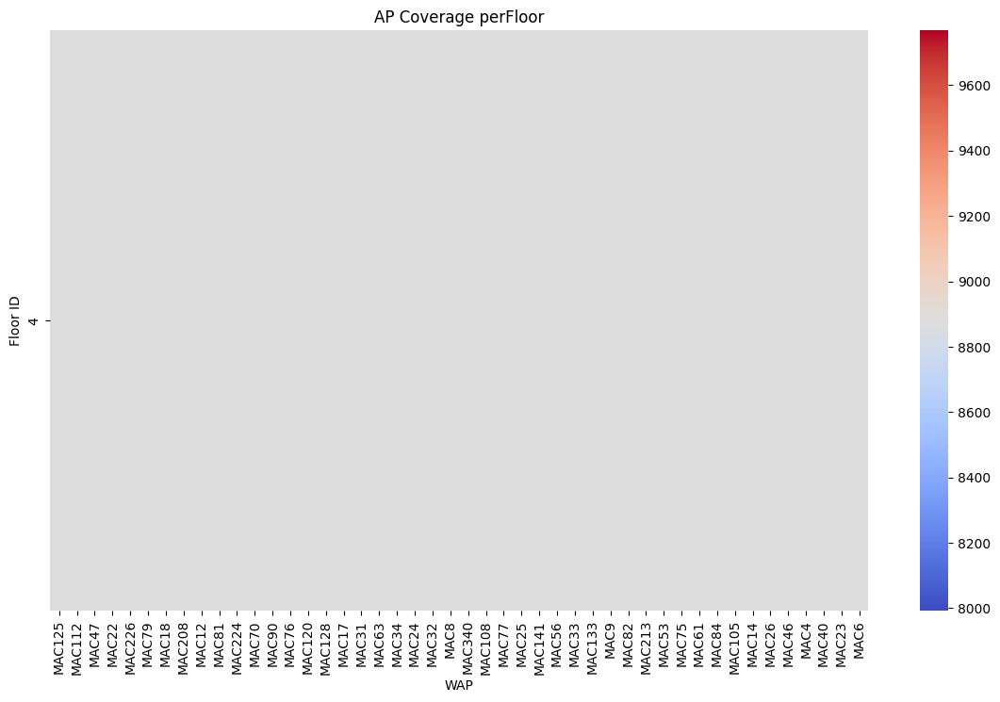

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FloorID')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
plt.savefig('ap_coverage_per_floor_s.png', dpi=300, bbox_inches='tight')
plt.show()

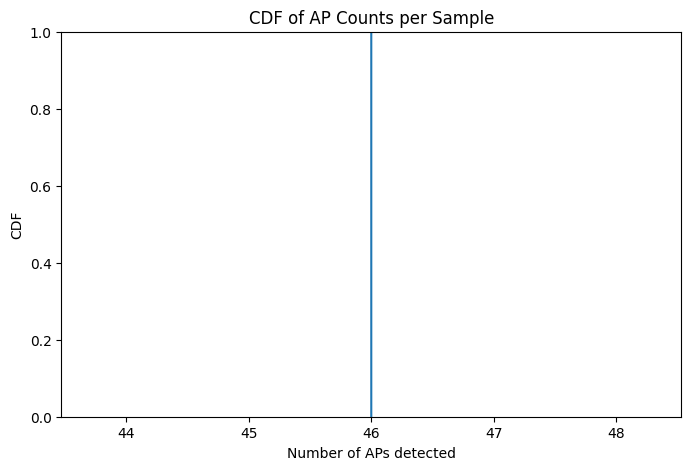

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_s.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
       MAC125  MAC112  MAC47  MAC22  MAC226  MAC79  MAC18  MAC208  MAC12  \
0      100.0   100.0  100.0    NaN   100.0  100.0    NaN   100.0  100.0   
1      100.0   100.0  100.0    NaN   100.0  100.0    NaN   100.0  100.0   
2      100.0   100.0  100.0    NaN   100.0  100.0    NaN   100.0  100.0   
3      100.0   100.0  100.0    NaN   100.0  100.0    NaN   100.0  100.0   
4      100.0   100.0  100.0    NaN   100.0  100.0    NaN   100.0  100.0   
...      ...     ...    ...    ...     ...    ...    ...     ...    ...   
8875     NaN   100.0  100.0  100.0     NaN  100.0  100.0     NaN  100.0   
8876     NaN   100.0  100.0  100.0     NaN  100.0  100.0     NaN  100.0   
8877     NaN   100.0  100.0  100.0     NaN  100.0  100.0     NaN  100.0   
8878     NaN   100.0  100.0  100.0     NaN  100.0  100.0     NaN  100.0   
8879     NaN   100.0  100.0  100.0     NaN  100.0  100.0     NaN  100.0   

      MAC81  ...   MAC6  ECoord  NCoord  FloorID  BuildingID  SceneID  UserID 

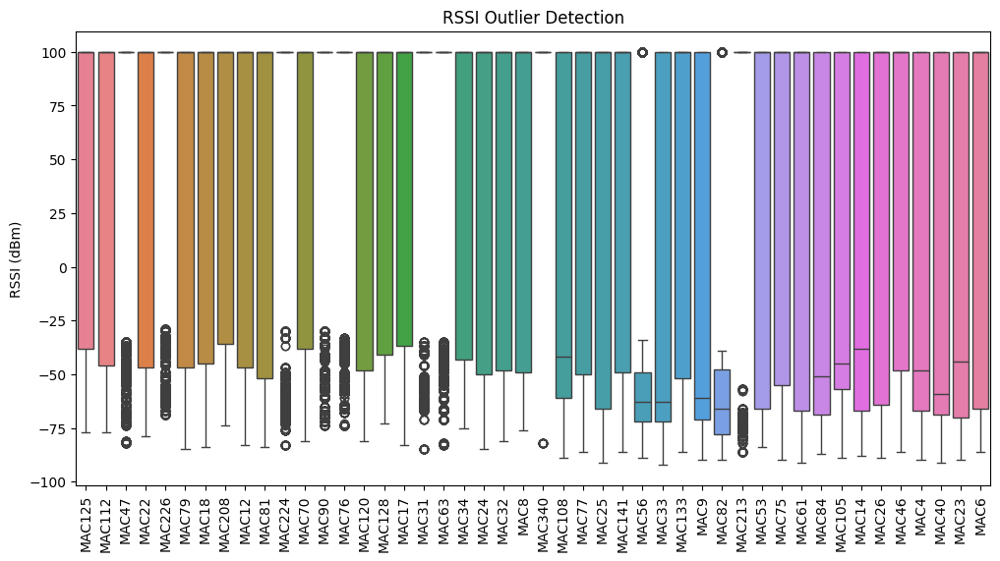

In [ ]:
# Outlier Detection in RSSI Values

# Identify extreme outliers
outliers = data[(data[rssi_columns] < -100) | (data[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)

# Plot RSSI boxplots to visualize anomalies
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Outlier Detection")
plt.ylabel("RSSI (dBm)")
plt.show()



RSSI Data Summary:
             MAC125       MAC112        MAC47        MAC22       MAC226  \
count  8880.000000  8880.000000  8880.000000  8880.000000  8880.000000   
mean     57.518468    47.770833    66.775113    43.995158    67.034797   
std      68.846378    72.084872    63.161003    74.440582    61.761603   
min     -77.000000   -77.000000   -82.000000   -79.000000   -69.000000   
25%     -38.000000   -46.000000   100.000000   -47.000000   100.000000   
50%     100.000000   100.000000   100.000000   100.000000   100.000000   
75%     100.000000   100.000000   100.000000   100.000000   100.000000   
max     100.000000   100.000000   100.000000   100.000000   100.000000   

             MAC79        MAC18       MAC208        MAC12        MAC81  ...  \
count  8880.000000  8880.000000  8880.000000  8880.000000  8880.000000  ...   
mean     39.654955    54.975901    59.440653    46.516667    36.586712  ...   
std      74.307133    71.434048    65.978520    73.334456    76.240210  ...

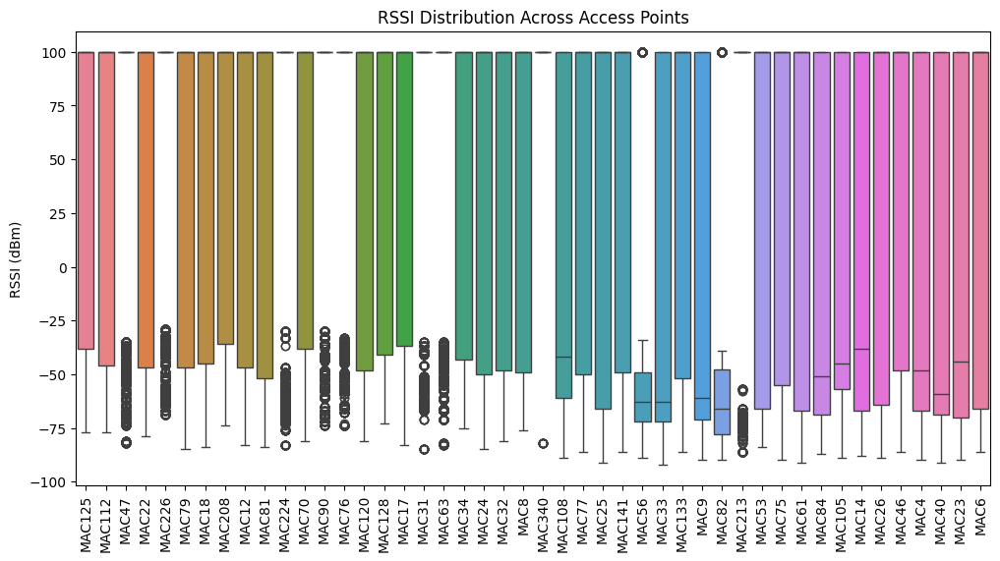

In [ ]:
# RSSI Distribution Across APs

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())

# Boxplot of RSSI values
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[rssi_columns])
plt.xticks(rotation=90)
plt.title("RSSI Distribution Across Access Points")
plt.ylabel("RSSI (dBm)")
plt.show()


<ipython-input-90-fb2e8d04ef17>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)


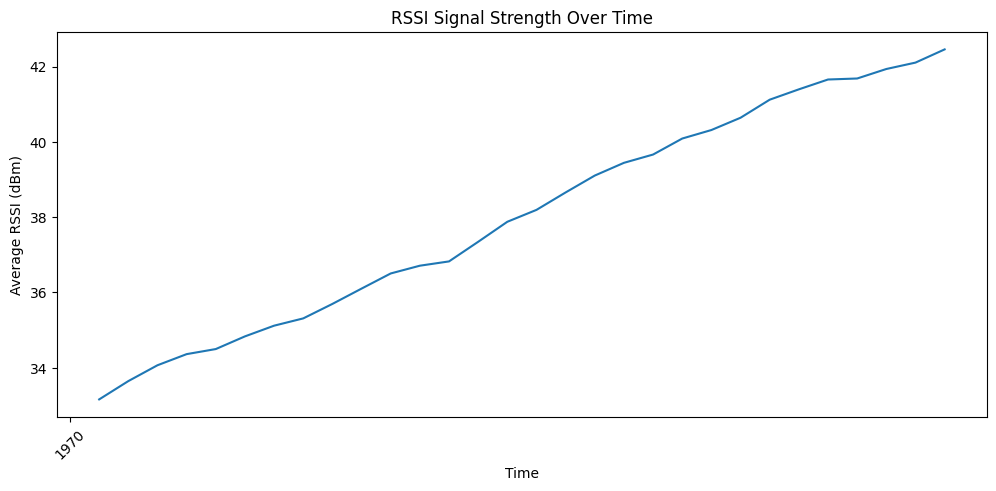

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["SampleTimes"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


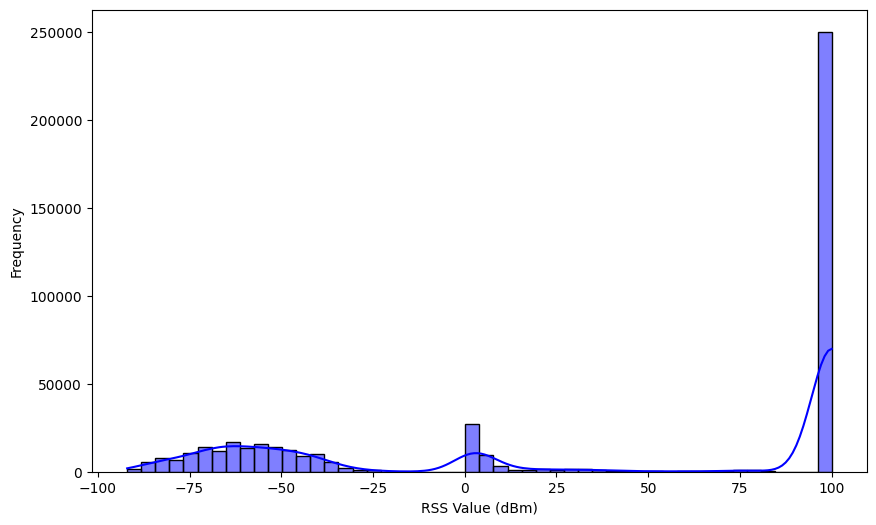

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data.iloc[:, :52].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
# plt.title('Distribution of RSS Values')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.savefig('rssi_distribution_syl.png', dpi=300, bbox_inches='tight')

plt.show()


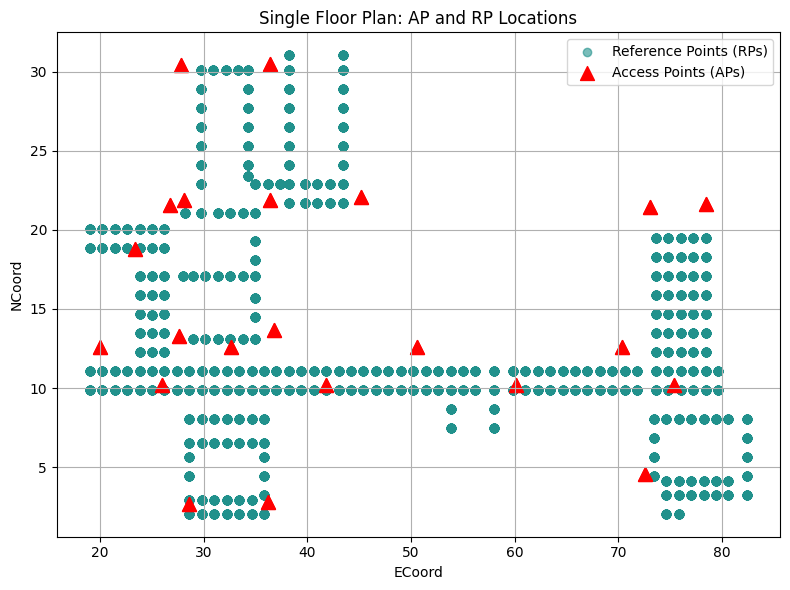

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Define AP positions
waps_positions = [
    ['MAC125', 50.627, 12.600],    ['MAC112', 70.327, 12.600],    ['MAC47', 36.236, 2.820],    ['MAC22', 23.427, 18.805],
    ['MAC226', 78.427, 21.600],    ['MAC79', 32.632, 12.600],    ['MAC18', 20.037, 12.600],    ['MAC208', 73.027, 21.412],
    ['MAC12', 26.033, 10.199],    ['MAC81', 41.777, 10.200],    ['MAC224', 72.574, 4.580],    ['MAC70', 32.416, 32.074],
    ['MAC90', 28.554, 2.650],    ['MAC76', 45.226, 22.093],    ['MAC120', 60.127, 10.200],    ['MAC128', 75.377, 10.200],
    ['MAC17', 36.427, 30.476],    ['MAC31', 36.432, 21.863],    ['MAC63', 27.870, 30.404],    ['MAC34', 28.125, 21.895],
    ['MAC24', 27.627, 13.303],    ['MAC32', 36.818, 13.638],    ['MAC8', 26.801, 21.563],    ['MAC340', 50.627, 12.600],
    ['MAC108', 70.327, 12.600],    ['MAC77', 36.236, 2.820],    ['MAC25', 23.427, 18.805],    ['MAC141', 78.427, 21.600],
    ['MAC56', 32.632, 12.600],    ['MAC33', 20.037, 12.600],    ['MAC133', 73.027, 21.412],    ['MAC9', 26.033, 10.199],
    ['MAC82', 41.777, 10.200],    ['MAC213', 72.574, 4.580],    ['MAC53', 32.416, 32.074],    ['MAC75', 28.554, 2.650],
    ['MAC61', 45.226, 22.093],    ['MAC84', 60.127, 10.200],    ['MAC105', 75.377, 10.200],    ['MAC14', 36.427, 30.476],
    ['MAC26', 36.432, 21.863],    ['MAC46', 27.870, 30.404],    ['MAC4', 28.125, 21.895],    ['MAC40', 27.627, 13.303],
    ['MAC23', 36.818, 13.638],    ['MAC6', 26.801, 21.563]]

anchors = pd.DataFrame(waps_positions, columns=['MAC_ID', 'ECoord_AP', 'NCoord_AP'])

# Create the plot for a single floor
fig, ax = plt.subplots(figsize=(8, 6))

# Plot RPs
ax.scatter(data['ECoord'], data['NCoord'], c='#21918C', label='Reference Points (RPs)', alpha=0.6)

# Determine bounding box
min_E = data['ECoord'].min()
max_E = data['ECoord'].max()
min_N = data['NCoord'].min()
max_N = data['NCoord'].max()

# Filter APs that fall within the bounding box
floor_anchors = anchors[
    (anchors['ECoord_AP'] >= min_E) & (anchors['ECoord_AP'] <= max_E) &
    (anchors['NCoord_AP'] >= min_N) & (anchors['NCoord_AP'] <= max_N)
]

# Plot APs
ax.scatter(floor_anchors['ECoord_AP'], floor_anchors['NCoord_AP'], c='red', marker='^', s=100, label='Access Points (APs)')

ax.set_title('Single Floor Plan: AP and RP Locations')
ax.set_xlabel('ECoord')
ax.set_ylabel('NCoord')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig('spatial_distribution_syl.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-93-0f0587b3785d>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


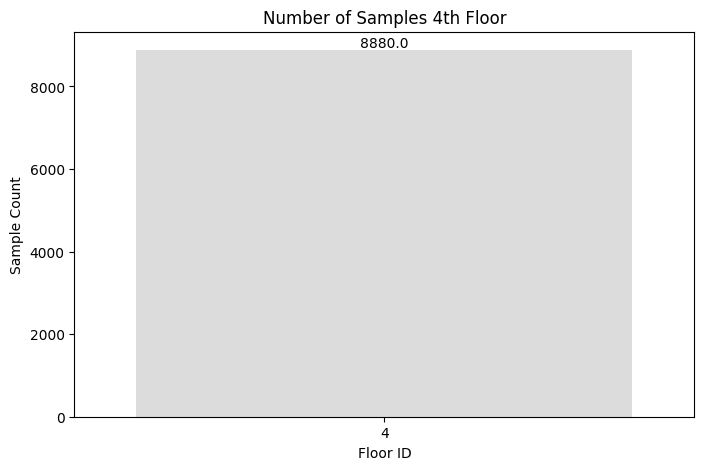

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count samples per floor
floor_counts = data["FloorID"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title("Number of Samples 4th Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")

plt.show()



Devices used for collection: [1 2]


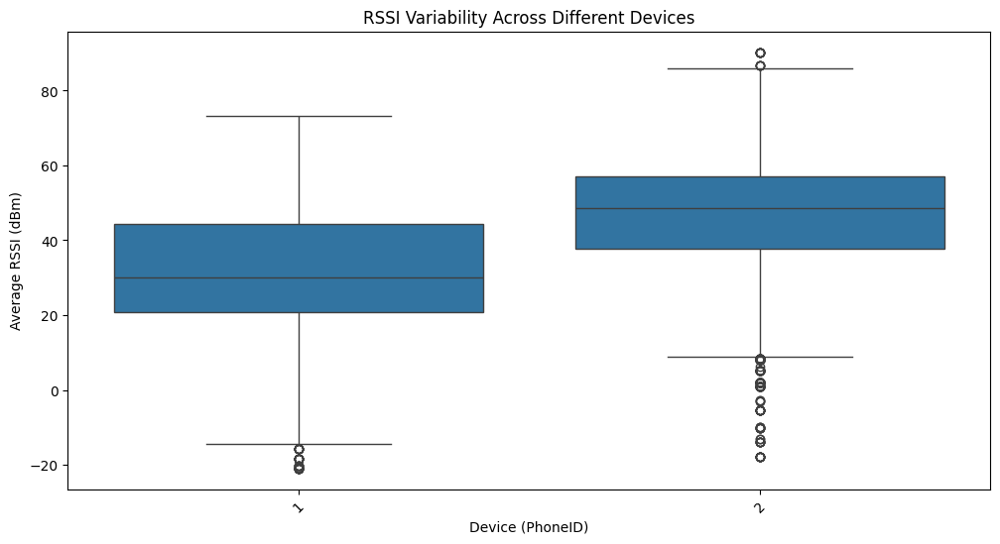

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PhoneID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PhoneID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PhoneID)")
plt.ylabel("Average RSSI (dBm)")
plt.show()



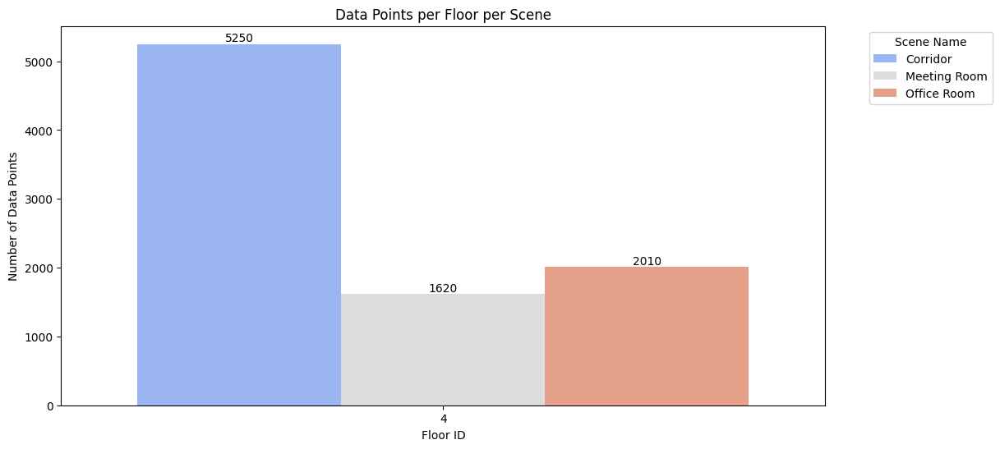

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a mapping for SceneID to scene names
scene_mapping = {1: "Corridor", 2: "Office Room", 3: "Meeting Room"}

# Map SceneID values to scene names
data["SceneName"] = data["SceneID"].map(scene_mapping)

# Count data points per FloorID and SceneName
floor_scene_counts = data.groupby(["FloorID", "SceneName"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="FloorID", y="Count", hue="SceneName", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10)

# Labels and title
plt.xlabel("Floor ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per Floor per Scene")
plt.legend(title="Scene Name", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show plot
plt.show()


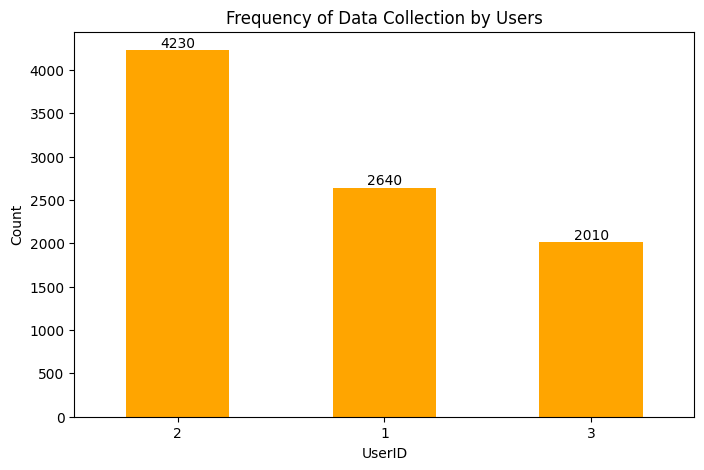

In [ ]:
import matplotlib.pyplot as plt

# Count occurrences of each UserID
user_counts = data['UserID'].value_counts()

# Create bar chart
plt.figure(figsize=(8, 5))
ax = user_counts.plot(kind='bar', color='orange')

# Annotate bars with values
for p in ax.patches:
    ax.annotate(f"{p.get_height()}",
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()



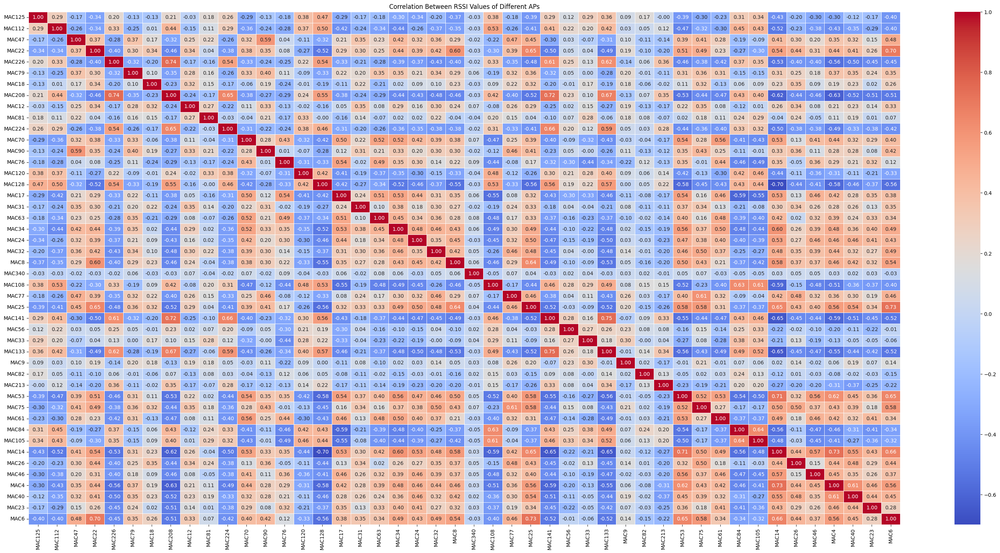

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs with annotations
plt.figure(figsize=(38, 18))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)

# Title
plt.title("Correlation Between RSSI Values of Different APs")

plt.show()


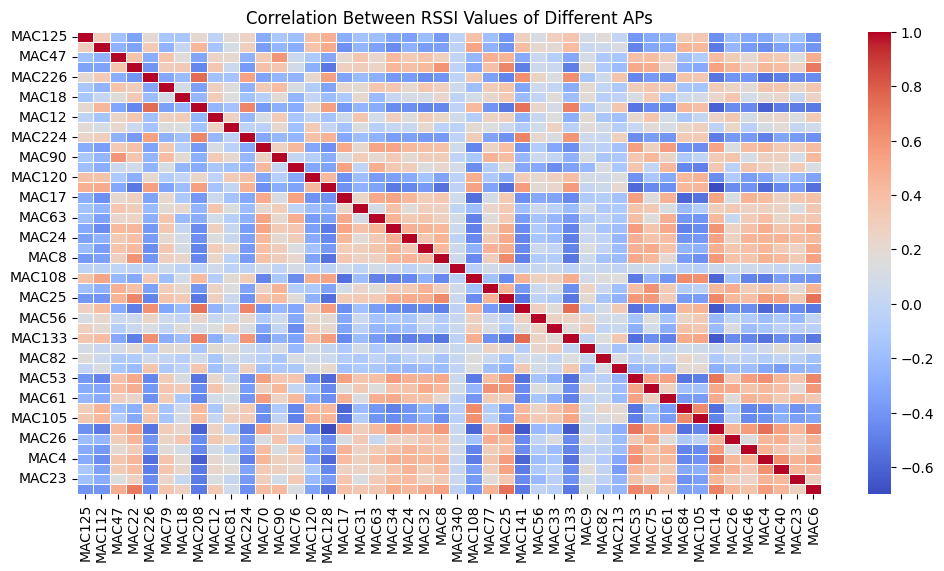

In [ ]:
# Correlation Between APs (MAC Addresses)

# Compute correlation matrix for APs
corr_matrix = data[rssi_columns].corr()

# Heatmap of RSSI correlation between APs
plt.figure(figsize=(12, 6))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Correlation Between RSSI Values of Different APs")
plt.show()


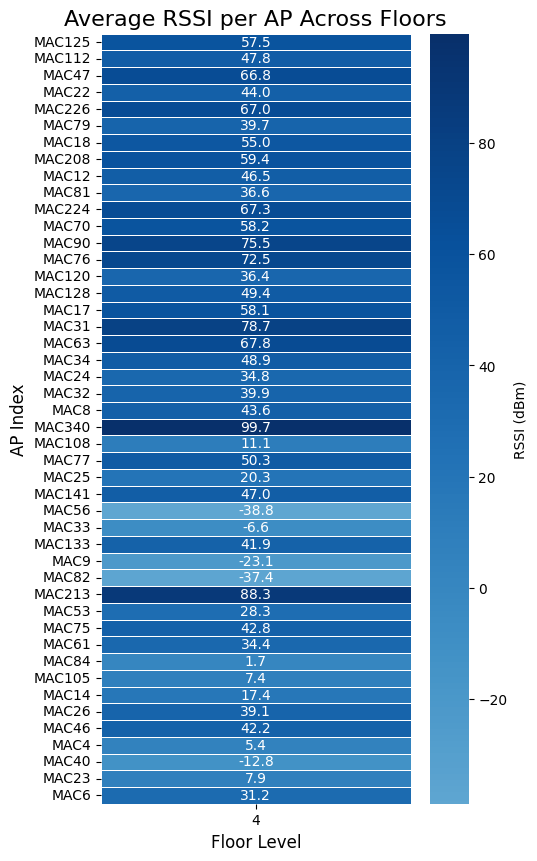

In [ ]:
# ===========================
# 4. AP Signal Coverage per Floor (WITH VALUES)
# ===========================
floor_column = 'FloorID'  # Define floor_column as 'FloorID'
rssi_columns = [col for col in data.columns if "MAC" in col]

floor_rssi_means = data.groupby(floor_column)[rssi_columns].mean()

plt.figure(figsize=(5, 10))
sns.heatmap(
    floor_rssi_means.T,
    cmap="Blues",
    center=-50,
    annot=True,  # Display values
    fmt=".1f",   # Format values to 1 decimal place
    linewidths=0.5,  # Add grid lines
    cbar_kws={'label': 'RSSI (dBm)'}  # Label for the color bar
)

plt.title("Average RSSI per AP Across Floors", fontsize=16)
plt.xlabel("Floor Level", fontsize=12)
plt.ylabel("AP Index", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('avg_rssi_per_room_syl.png', dpi=300, bbox_inches='tight')
plt.show()

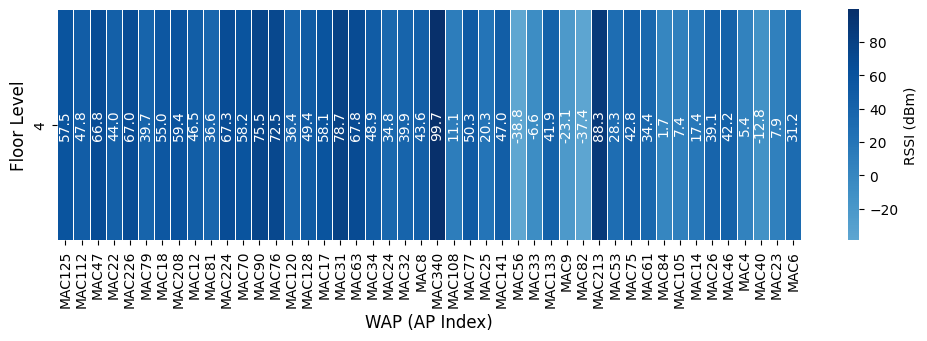

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define floor_column as 'FloorID'
floor_column = 'FloorID'

# Select columns that contain MAC addresses
rssi_columns = [col for col in data.columns if "MAC" in col]

# Compute the mean RSSI per floor
floor_rssi_means = data.groupby(floor_column)[rssi_columns].mean()

# Create the heatmap
plt.figure(figsize=(12, 3))
sns.heatmap(
    floor_rssi_means,  # WAPs on x-axis, Floors on y-axis
    cmap="Blues",
    center=-50,
    annot=True,  # Display values
    fmt=".1f",   # Format values to 1 decimal place
    linewidths=0.5,  # Add grid lines
    cbar_kws={'label': 'RSSI (dBm)'},  # Label for the color bar
    annot_kws={"rotation": 90},  # Rotate text vertically inside cells
)

# plt.title("Average RSSI per AP Across Floors", fontsize=16)
plt.xlabel("WAP (AP Index)", fontsize=12)  # APs on x-axis
plt.ylabel("Floor Level", fontsize=12)  # Floors on y-axis
plt.xticks(rotation=90, fontsize=10)  # Rotate x-axis labels for readability
plt.yticks(fontsize=10)
plt.savefig('avg_rssi_per_room_syl.png', dpi=300, bbox_inches='tight')
plt.show()
